In [249]:
# to_save, to_load = False, True
session_file = "./tmp/TIC_87869692_EA_ROT.ipynb.pkl"

# # load/save the notebook session
# # https://dill.readthedocs.io/en/latest/
# if True: 
#     import dill
#     dill.load_module(session_file)`
#     print(f"Notebook session loaded from  {session_file}")

# if True:  # save the notebook session
#     import dill
#     dill.dump_module(session_file)
#     print(f"Notebook session saved in {session_file}")


Notebook session saved in ./tmp/TIC_87869692_EA_ROT.ipynb.pkl


In [1]:
import sys
if "../" not in sys.path:  # to get my usual helpers at base dir
    sys.path.append("../")

import lightkurve as lk
from lightkurve_ext import of_sector, of_sectors, of_2min_cadences
import lightkurve_ext as lke
from lightkurve_ext import TransitTimeSpec, TransitTimeSpecList
import lightkurve_ext_tess as lket
import lightkurve_ext_pg as lke_pg
import lightkurve_ext_pg_runner as lke_pg_runner
import tic_plot as tplt

import asyncio_compat

import math
import re
import warnings

import numpy as np
import matplotlib.pyplot as plt
import matplotlib as matplotlib

import pandas as pd
import astropy as astropy
from astropy import units as u
from astropy.coordinates import SkyCoord
from astropy.time import Time, TimeDelta
from astropy.io import fits

from matplotlib.ticker import (FormatStrFormatter, AutoMinorLocator)

from importlib import reload # useful during development to reload packages

from IPython.display import display, HTML, Javascript, clear_output

display(HTML("<style>.container { width:99% !important; }</style>"))  # Jupyter 6
display(HTML("<style>.jp-Notebook { --jp-notebook-max-width: 98%; }</style>"))  # Jupyter 7


# No longer works in Jupyter 7+
display(Javascript("""
// export notebook url to Python for bokeh-based interactive features
if (window["IPython"] != null) {
  IPython.notebook.kernel.execute(`notebook_url = "${window.location.origin}"`);
} else {
  console.warn("IPython js object not available (in Jupyter 7). Hardcode notebook_url in the notebook itself instead.")
}
"""));
notebook_url = "localhost:8888"

%matplotlib inline

# data cache config
lk_download_dir = '../data'
if hasattr(lk, "conf"):  # default download dir
    lk.conf.cache_dir = lk_download_dir

# make markdown table aligned to the left of the cell output (instead of center)
display(HTML("<style>table {margin-left: 4ch;}</style>"))

<IPython.core.display.Javascript object>

# TIC 87869692 / HD 54371 Analysis (EA+ROT)

- new VSX entry


## TESS Data

In [2]:
tic = 87869692

sr = lk.search_lightcurve(f"TIC{tic}", )  # author="SPOC", cadence="short"
sr_unfiltered = sr  # keep a copy
sr = lke.filter_by_priority(sr, author_priority = ["SPOC", "TESS-SPOC", "QLP"])
# sr = sr[np.isin(sr.author, ["SPOC", "TESS-SPOC"])]  # QLP has 2 extra sectors (S85, S86) that shouldn't affect results much. Skip them 
sr = lke._sort_chronologically(sr)

astropy.table.pprint.conf.max_lines = 100  # to print all rows
display(sr)

# Note: only 1 sector of ready made lightcurve
# if needed, lightcurves can be created from sectors 37, 63, 64 (and in the future 90, 99, 100, 101)
lcc_tess = sr.download_all()
lcc_tess

#,mission,year,author,exptime,target_name,distance,proposal_id
,,,,s,,arcsec,
0,TESS Sector 44,2021,SPOC,120,87869692,0.0,G04191
1,TESS Sector 45,2021,SPOC,120,87869692,0.0,G04191
2,TESS Sector 71,2023,SPOC,120,87869692,0.0,G06200
3,TESS Sector 72,2023,SPOC,120,87869692,0.0,G06200


LightCurveCollection of 4 objects:
    0: <TessLightCurve LABEL="TIC 87869692" SECTOR=44 AUTHOR=SPOC FLUX_ORIGIN=pdcsap_flux>
    1: <TessLightCurve LABEL="TIC 87869692" SECTOR=45 AUTHOR=SPOC FLUX_ORIGIN=pdcsap_flux>
    2: <TessLightCurve LABEL="TIC 87869692" SECTOR=71 AUTHOR=SPOC FLUX_ORIGIN=pdcsap_flux>
    3: <TessLightCurve LABEL="TIC 87869692" SECTOR=72 AUTHOR=SPOC FLUX_ORIGIN=pdcsap_flux>

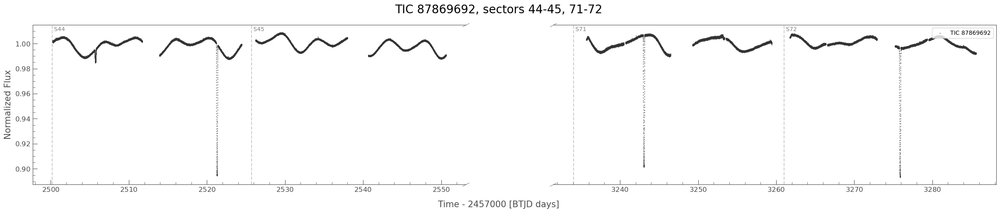

In [4]:
lc = lke.stitch(lcc_tess, ignore_incompatible_column_warning=True, )

axs = tplt.plot_skip_data_gap(lc, figsize=(30,5), s=1, alpha=0.9);
axs[0].get_figure().suptitle(f"{lc.label}, sectors {lke.abbrev_sector_list(lc)}", fontsize=20);
# [ax.set_ylim(0.85, 1.05) for ax in axs];

### Source Identifcation of the Variabilities

The observed variabilities in TESS data are all from the target.

In per-pixel plots, the variabilities all have similar spread centered around the target.

Eclipses:

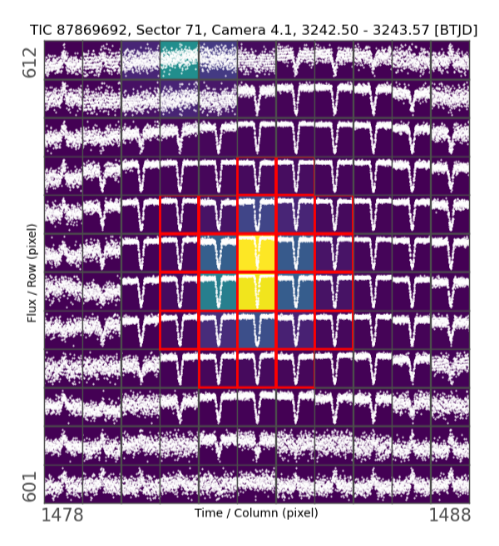

See also: [TCE DVM](https://mast.stsci.edu/api/v0.1/Download/file/?uri=mast:TESS/product/tess2018235142541-s0002-s0072-0000000087869692-01-00829_dvs.pdf)


## ASAS-3 Variable data

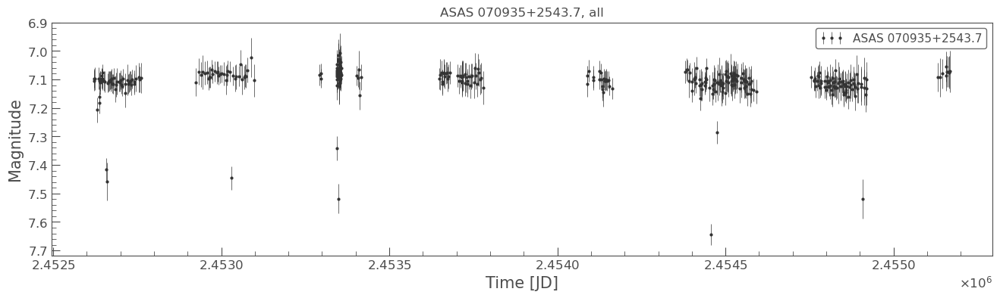

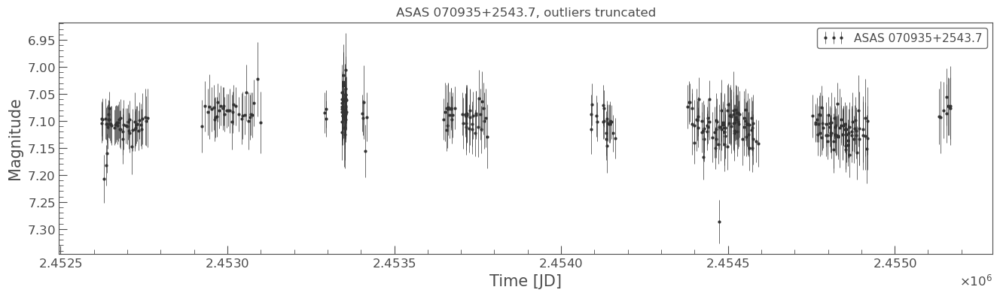

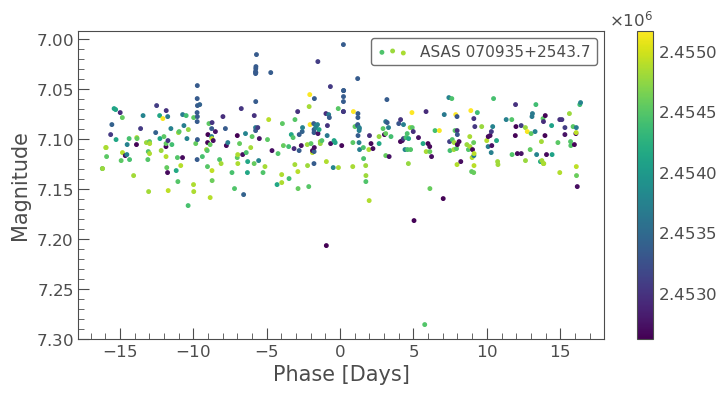

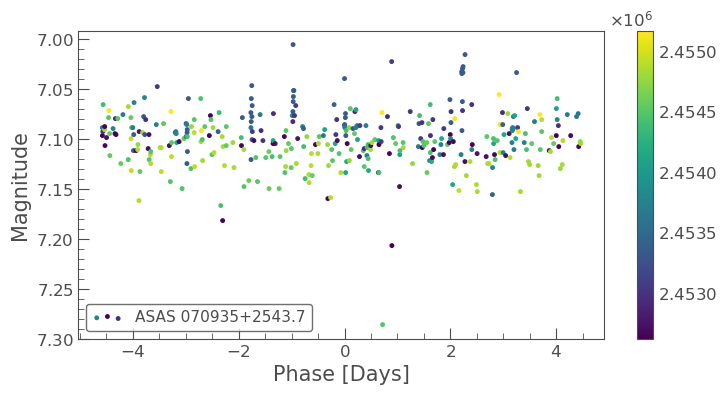

In [8]:
import lightkurve_ext_readers as lker
reload(lker)
# 
# from https://home.strw.leidenuniv.nl/~burggraaff/MASCARA_variables/on_disk/65605.html
_lc = lker.read_asas3("http://www.astrouw.edu.pl/cgi-asas/asas_cgi_get_data?070935+2543.7,asas3")
_lc.meta["LABEL"] = "ASAS 070935+2543.7"
ax = tplt.errorbar(_lc, figsize=(16, 4));
ax.set_title(_lc.label + ", all");

# lots of data points much fainter than the expected range, especially before HJD 2453000
_lc = _lc.truncate(None, 7.3, column="flux") 
ax = tplt.errorbar(_lc, figsize=(16, 4));
ax.set_title(_lc.label + ", outliers truncated");

_lc_f = _lc.fold(period=32.8074, epoch_time=Time(2521.29, format="btjd").to_value("jd"), wrap_phase=None)  # initial epoch / period from TCE
ax = tplt.scatter(_lc_f, s=25, c=_lc_f.time_original.value);

_lc_f = _lc.fold(period=9.1746, epoch_time=None, wrap_phase=None)  # initial epoch / period from LS 
ax = tplt.scatter(_lc_f, s=25, c=_lc_f.time_original.value);

# ax = tplt.errorbar(_lc_f.truncate(-1, 1));
# ax.axvline(0, color="red", linestyle="--");
# ax.axvspan(-7/24/2, 7/24/2, color="red", alpha=0.3);

# use the outlier-truncated version
lc_asas3 = _lc 

## Hipparcos data

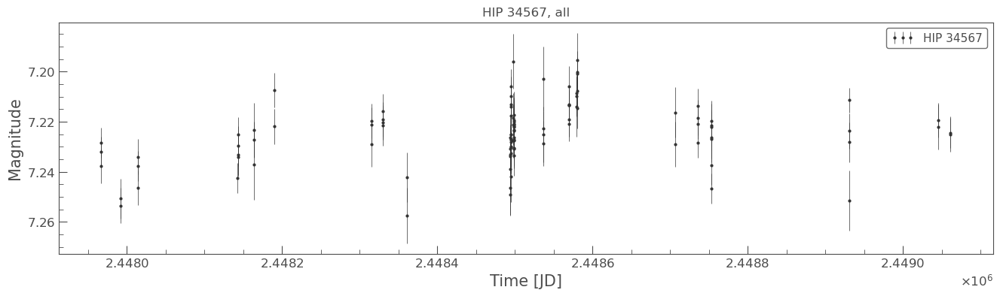

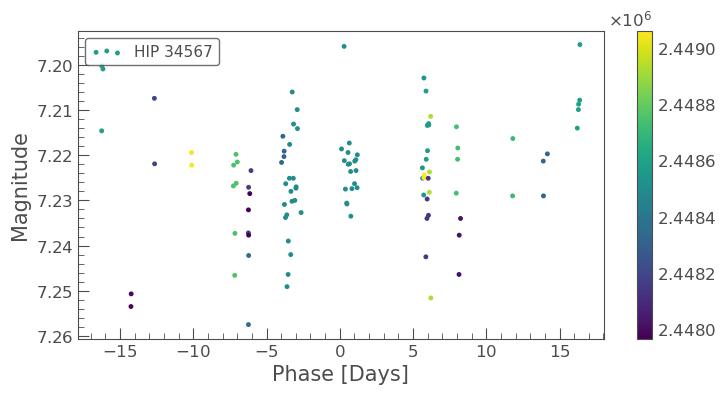

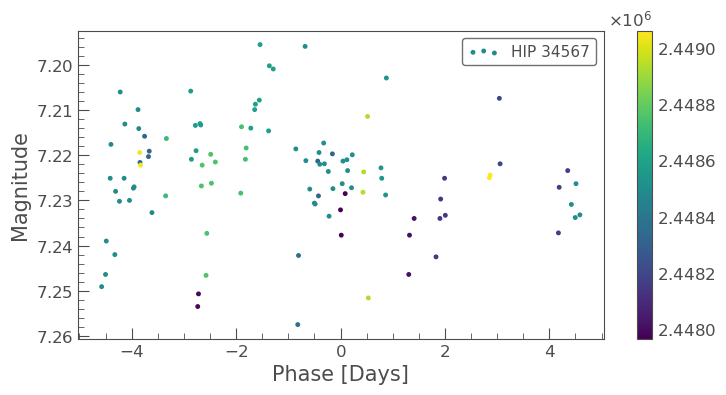

In [10]:
# See if ASAS-SN data is usable despite satuartion
# not too useful. one could barely see rotational varaiability in g

import lightkurve_ext_readers as lker

_lc = lker.read_hipparcos_data("https://cdsarc.cds.unistra.fr/viz-bin/nph-Plot/Vgraph/txt?I/239/34567")
ax = tplt.errorbar(_lc, figsize=(16, 4));
ax.set_title(_lc.label + ", all");

_lc_f = _lc.fold(period=32.8074, epoch_time=Time(2521.29, format="btjd").to_value("jd"), wrap_phase=None)  # initial epoch / period from TCE
ax = tplt.scatter(_lc_f, s=25, c=_lc_f.time_original.value);

_lc_f = _lc.fold(period=9.1746, epoch_time=None, wrap_phase=None)  # initial epoch / period from LS 
ax = tplt.scatter(_lc_f, s=25, c=_lc_f.time_original.value);

lc_hipparcos = _lc 

## Gaia DR3 info (coordinate, etc.)

In [11]:
# reload(lke)
# reload (lket)
rs_all_cols, rs, rs_html  = lket.search_gaiadr3_of_tics(tic, radius_arcsec=5, magnitude_range=None,  pm_error_factor=None, pm_range_fraction=None, pm_range_minimum=None, 
                                                        calc_separation_from_first_row=True,  # assuming the first row is the target, it'd calculate more accurately the separation for Gaia DR3 Main
                                                        compact_columns=True, also_return_html=True, also_return_astrophysical=False, verbose_html=True, include_nss_summary_in_html=False)
display(HTML(rs_html))

# from Gaia DR3
target_coord = SkyCoord(rs[0]["RAJ2000"], rs[0]["DEJ2000"], unit=(u.deg, u.deg), frame="icrs")
target_coord_dict = dict(ra=target_coord.ra.value, dec=target_coord.dec.value)


Listed as a SB1	with 32.80745 d period in Gaia DR3 NSS (model AstroSpectroSB1)  (also present in SB9)


In [12]:
# primary_name = f"TIC {tic}"
primary_name = "HD 54371"   # use HD rather than TIC, on the account of existing SB observations
primary_name

'HD 54371'

## Combining all data


TESS # data points: 66086
ASAS-3 # data points: 368
Hipparcos # data points: 106


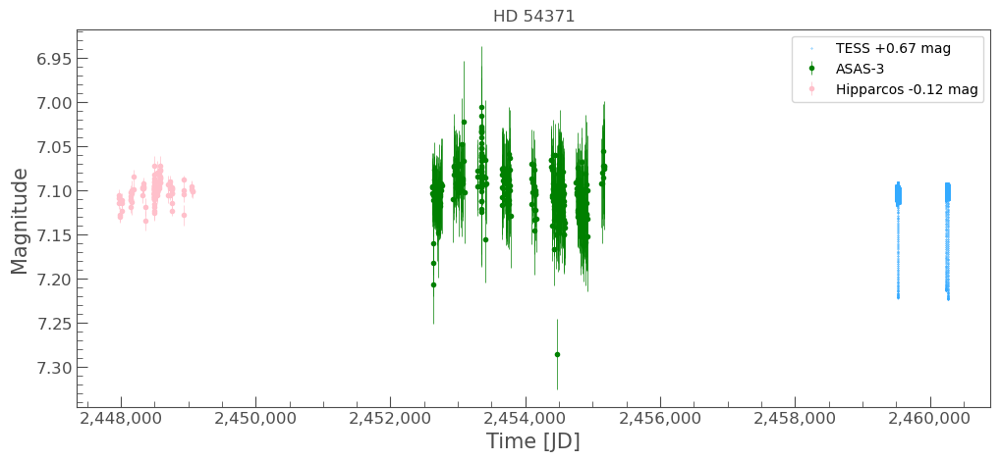

In [13]:
# Convert the data to magnitude and HJD/UTC

import lightkurve_ext_multi_sources as lkem
# reload(lkem)

lc_tess = lke.stitch(lcc_tess, ignore_incompatible_column_warning=True)
lc_tess = lke.to_flux_in_mag_by_normalization(lc_tess)
lc_tess = lke.convert_lc_time_to_hjd_utc(lc_tess, target_coord=target_coord, cache_dir=lk_download_dir)

# axs = tplt.plot_skip_data_gap(lc_tess, figsize=(30,5), s=4, alpha=0.9);

lc_combined_dict = lkem.combine_multi_bands_and_shift(
    {"TESS": lc_tess, 
     "ASAS-3": lc_asas3,
     "Hipparcos": lc_hipparcos,
    }, 
    shift_to="ASAS-3",
)

for k in lc_combined_dict.keys():
    print(f"{k} # data points:", len(lc_combined_dict[k]))

plot_options = lkem.get_default_plot_multi_bands_options_copy()
# for TESS plot (index 0) move it to the front
plot_options[0][1]["zorder"] = 9  # default 2

ax = lkem.plot_multi_bands(lc_combined_dict, figsize=(12, 5), target_name=primary_name, plot_options=plot_options);
# ax.set_ylim(9.2, 8.75);


##  Eclipse epoch / period / duration

- use TESS data only, eclipses not found in the others

### Initial epoch / period / duration


In [25]:
(32.8074 - 15.56)

17.2474

Adopted period / epoch / duration_hr:  32.8074 2459521.29 4.9
Min II phase: -0.4742


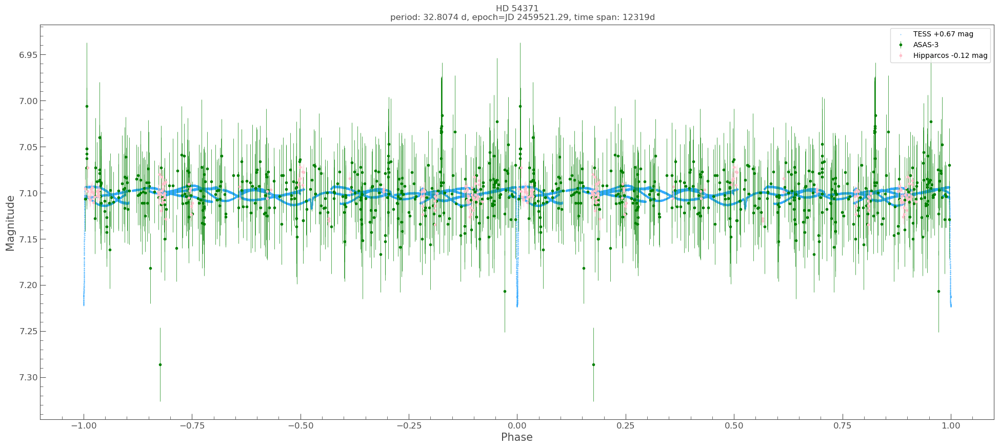

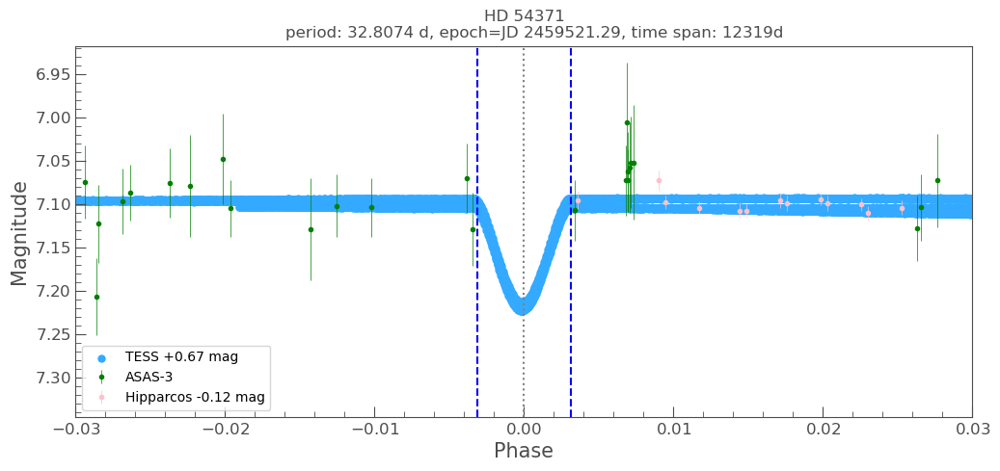

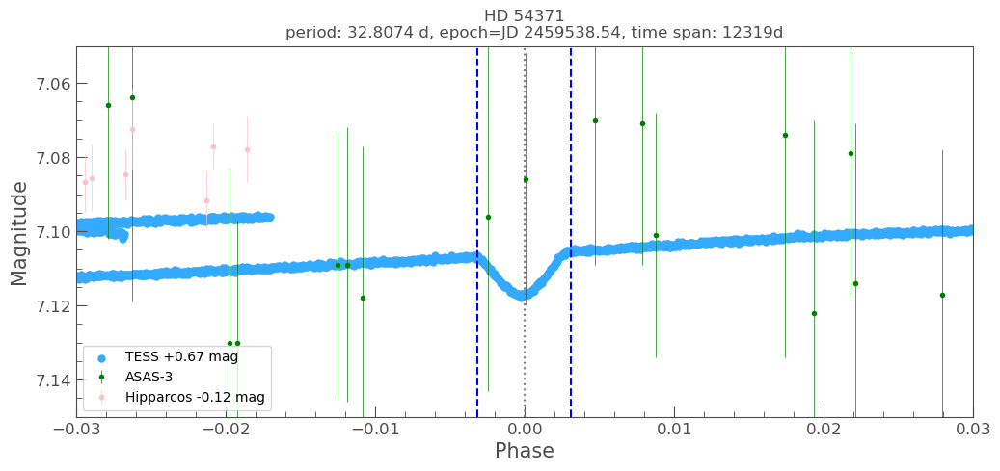

In [32]:
# from TCE
period_trial = 32.8074  # TCE
epoch_time_hjd_trial = round(lket.btjd_to_hjd_utc(2521.29, target_coord), 2)
duration_hr_min_i_trial = 4.9

print("Adopted period / epoch / duration_hr: ", period_trial, epoch_time_hjd_trial, duration_hr_min_i_trial)

# No Min II
# from mnaul inspection of TESS data
epoch_time_min_ii_hjd_trial = epoch_time_hjd_trial + 17.25  # - 15.56 _
epoch_phase_min_ii_trial   = abs(epoch_time_min_ii_hjd_trial   - epoch_time_hjd_trial  ) / period_trial   % 1
if epoch_phase_min_ii_trial   > 0.5:
    epoch_phase_min_ii_trial   = epoch_phase_min_ii_trial   - 1
epoch_phase_min_ii_trial  = round(epoch_phase_min_ii_trial  , 4)  # precsion from eyeballing zoomed plot
print("Min II phase:", epoch_phase_min_ii_trial)

duration_hr_min_ii_trial = 4.9

# --- Plot them to verify ---

ax, lc_f_res = lkem.fold_n_plot_multi_bands(
    lc_combined_dict,  # {"TESS": lc_tess},
    period=period_trial,
    epoch=Time(epoch_time_hjd_trial   , format="jd", scale="utc"),
    phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1    
    figsize=(24, 10),
    target_name=primary_name,
    # plot_options=plot_options,
);


# zoom plot Min I
# - make TESS more visible:  larger dots
plot_options_zoom = lkem.get_default_plot_multi_bands_options_copy()
plot_options_zoom[0][1]["s"] = 25
ax, lc_f_res = lkem.fold_n_plot_multi_bands(
    lc_combined_dict,  # {"TESS": lc_tess},
    period=period_trial  ,
    epoch=Time(epoch_time_hjd_trial   , format="jd", scale="utc"),
    phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1
    target_name=primary_name,
    duration_hr=duration_hr_min_i_trial  ,  # for plotting only
    figsize=(12, 5),
    plot_options=plot_options_zoom,
    # mag_shift_precision=2,  #
);
ylim = (None, None)
ax.set_ylim(*ylim);
ax.legend(loc="lower left");
ax.axvline(0, c="gray", linestyle="dotted");
ax.set_xlim(-0.03, 0.03);  # to see primary in details



# zoom plot Min II
ax, lc_f_res = lkem.fold_n_plot_multi_bands(
    lc_combined_dict,  # {"TESS": lc_tess},
    period=period_trial  ,
    epoch=Time(epoch_time_min_ii_hjd_trial   , format="jd", scale="utc"),
    phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1
    target_name=primary_name,
    duration_hr=duration_hr_min_ii_trial  ,  # for plotting only
    figsize=(12, 5),
    plot_options=plot_options_zoom,
    # mag_shift_precision=2,  #
);
ax.set_ylim(7.15, 7.05);
ax.legend(loc="lower left");
ax.axvline(0, c="gray", linestyle="dotted");
ax.set_xlim(-0.03, 0.03);  # to see secondary in details
# ax.set_xlim(epoch_phase_min_ii_trial -0.03, epoch_phase_min_ii_trial + 0.03);  # to see secondary in details


### Refine the period with MCMC on primary eclipses

- not too precise, as the eclipses also have ROT signals embedded, distorting its shape

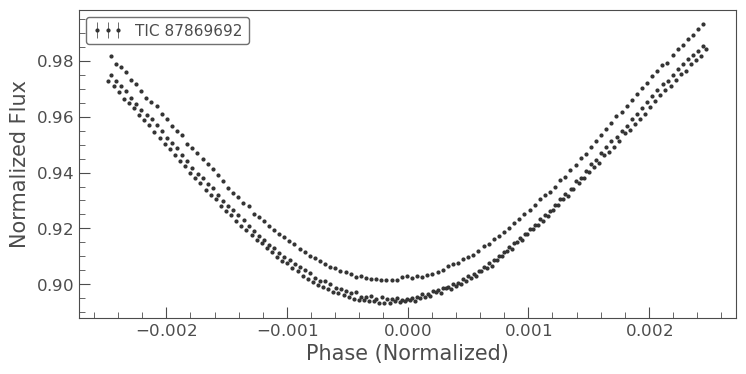

In [33]:
# reload(lke)

_lc = lke.to_normalized_flux_from_mag(lc_tess.remove_nans())

lc_f_min_i = _lc.fold(epoch_time=epoch_time_hjd_trial, period=period_trial, normalize_phase=True)
lc_f_min_i = lc_f_min_i.truncate((0 - duration_hr_min_i_trial / 24 * 0.4) / period_trial, (0 + duration_hr_min_i_trial /24 * 0.4) / period_trial)
# ax1 = tplt.scatter(lc_f_min_i, c=lc_f_min_i.time_original.value, s=25);
ax1 = tplt.errorbar(lc_f_min_i);



In [35]:
from types import SimpleNamespace

import sys
if "../eb_with_diff_sb_period/etv/" not in sys.path:  # for etvp
    sys.path.append("../eb_with_diff_sb_period/etv/")

import etv_functions_with_period as etvp
import etv_functions
# reload(etv_functions)

lc_f = lc_f_min_i

# # median flux, -eclipse depth, t0, related to duration, related to shape (U or V) 
# # t0 in normalixed phase
start_vals = [1.0, -0.105, 0, 0.0015, 1.0]


# convert lc to the form needed by fit etv_functions
lc_f_data = SimpleNamespace(time=lc_f.time_original.value, phase=lc_f.time.value, flux=np.array(lc_f.flux.value), err=np.array(lc_f.flux_err.value))
etv_functions.plot_initial_guess_interactive(lc_f_data, None, None, None, "0", *start_vals)

Output(layout=Layout(padding='1em 0px'), outputs=({'output_type': 'display_data', 'data': {'text/plain': '<Fig…

Output(layout=Layout(padding='1em'), outputs=({'name': 'stdout', 'text': '[1.0, -0.105, 0, 0.0015, 1.0]\n\n', …

100%|██████████████████████████████████████████████████████████| 4000/4000 [01:10<00:00, 56.34it/s]


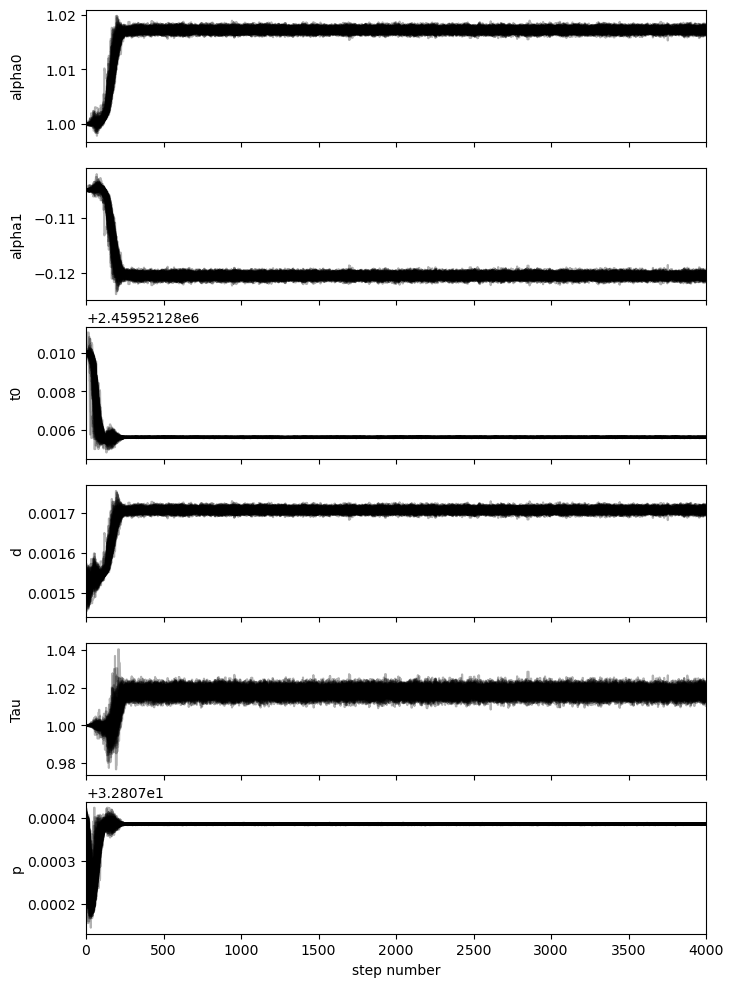

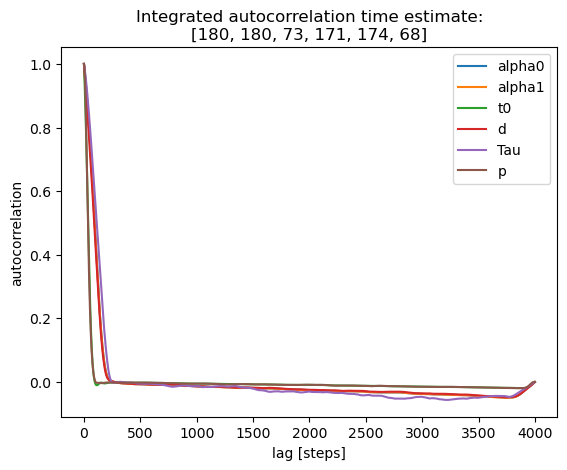

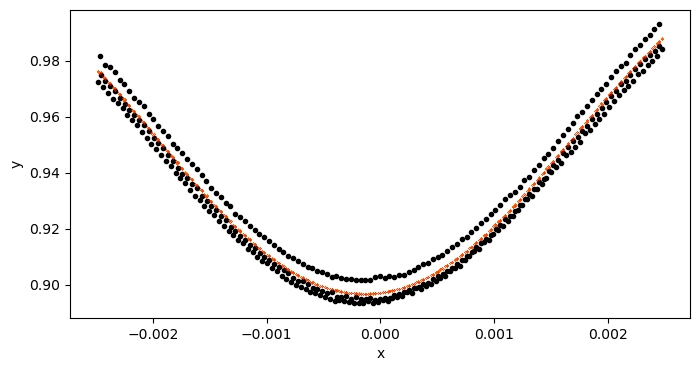

mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = 1.0171970852379206, -0.12046112997119247, 2459521.285614599, 0.0017065893600229248, 1.0176749764560826, 32.80738560195678
std_t0: 1.4007371783194161e-05
std_p: 7.518184365429546e-07


In [37]:
mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p, fit_params_p_stats  = etvp.run_mcmc_initial_fit_p(
    lc_f_data, 
    [1.0, -0.105, epoch_time_hjd_trial, 0.0015, 1.0, period_trial],
    # nruns=20, discard=1,
    nruns=4000, discard=1000,
    autocorr_time_kwargs=dict(tol=20),  # the emcee defaults tol=50 seems to be too strict for our use case, tol of ~10 - 20 seems to be sufficient    
    pool=-2, 
    plot_chains=True, plot_autocorrelation=True, plot=True, 
    also_return_stats=True,
)

print("mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p]]))
print("std_t0:", fit_params_p_stats["std_t0"])
print("std_p:", fit_params_p_stats["std_p"])


In [38]:
print("mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p]]))
print("std_t0:", fit_params_p_stats["std_t0"])
print("std_p:", fit_params_p_stats["std_p"])


mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = 1.0171970852379206, -0.12046112997119247, 2459521.285614599, 0.0017065893600229248, 1.0176749764560826, 32.80738560195678
std_t0: 1.4007371783194161e-05
std_p: 7.518184365429546e-07


### Final epoch / period / duration


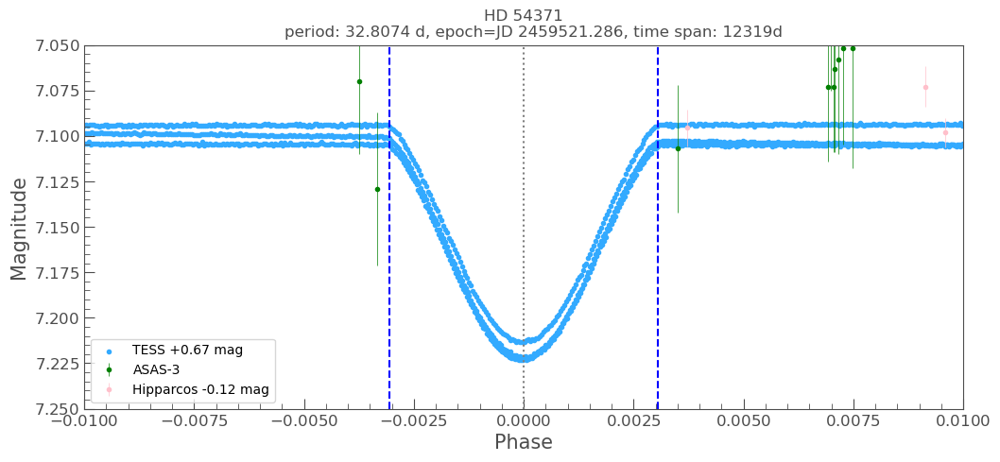

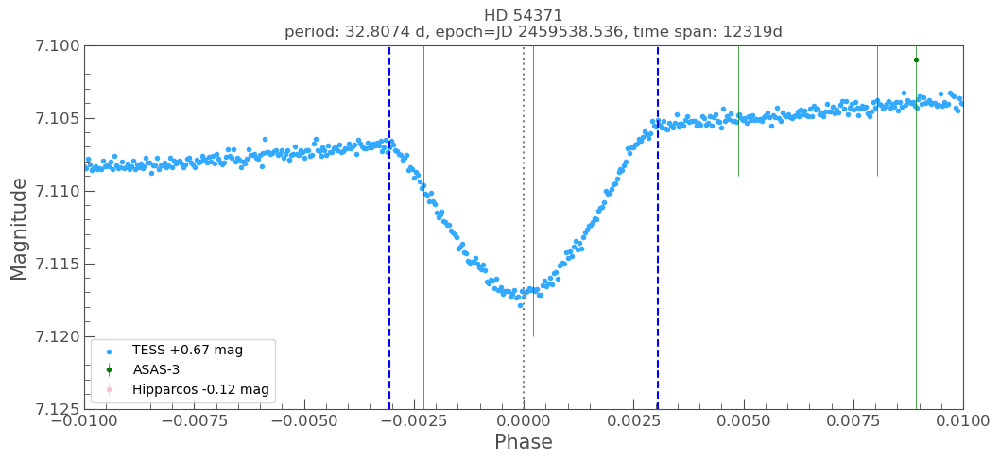

In [158]:
# Cannot tell the difference between TCE period and BLS period, cut 1 digit and choose the best
period_final = 32.8074   # from MCMC, precision adjusted from inspecting folded LC below
epoch_time_hjd_final = 2459521.286  # from MCMC
duration_hr_min_i_final = 4.8

epoch_time_min_ii_hjd_final = epoch_time_hjd_final + 17.25  # - 15.56 _
epoch_phase_min_ii_final   = abs(epoch_time_min_ii_hjd_final   - epoch_time_hjd_final  ) / period_final   % 1
if epoch_phase_min_ii_final   > 0.5:
    epoch_phase_min_ii_final   = epoch_phase_min_ii_final   - 1
epoch_phase_min_ii_final  = round(epoch_phase_min_ii_final  , 4)  # precsion from eyeballing zoomed plot
duration_hr_min_ii_final = 4.8


# --- Plot them to verify ---

# ax, lc_f_res = lkem.fold_n_plot_multi_bands(
#     {"TESS": lc_tess},
#     period=period_final,
#     epoch=Time(epoch_time_hjd_final   , format="jd", scale="utc"),
#     phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1    
#     figsize=(24, 10),
#     target_name=primary_name,
#     # plot_options=plot_options,
# );
# ylim = (None, None)
# ax.set_ylim(*ylim);


# zoom plot Min I
# - make TESS more visible:  larger dots
plot_options_zoom = lkem.get_default_plot_multi_bands_options_copy()
plot_options_zoom[0][1]["s"] = 9
plot_options_zoom[2][1]["zorder"] = 9
ax, lc_f_res = lkem.fold_n_plot_multi_bands(
    lc_combined_dict,  # {"TESS": lc_tess},
    period=period_final  ,
    epoch=Time(epoch_time_hjd_final   , format="jd", scale="utc"),
    phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1
    target_name=primary_name,
    duration_hr=duration_hr_min_i_final  ,  # for plotting only
    figsize=(12, 5),
    plot_options=plot_options_zoom,
    # mag_shift_precision=2,  #
);
ax.set_ylim(7.25, 7.05);
ax.legend(loc="lower left");
ax.axvline(0, c="gray", linestyle="dotted");
ax.set_xlim(-0.01, 0.01);  # to see primary in details


# zoom plot Min II
ax, lc_f_res = lkem.fold_n_plot_multi_bands(
    lc_combined_dict,  # {"TESS": lc_tess},
    period=period_final  ,
    epoch=Time(epoch_time_min_ii_hjd_final, format="jd", scale="utc"),
    phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1
    target_name=primary_name,
    duration_hr=duration_hr_min_ii_final ,  # for plotting only
    figsize=(12, 5),
    plot_options=plot_options_zoom,
    # mag_shift_precision=2,  #
);
ax.set_ylim(7.125, 7.10);
ax.legend(loc="lower left");
ax.axvline(0, c="gray", linestyle="dotted");
ax.set_xlim(-0.01, 0.01);  # to see secondary in details

## Rotation epoch / period

### Rotation period trial / refinement

#### Trial with Lomb-Scargle, MCMC and visual inspection of candidate periods

- ANOVA skipped

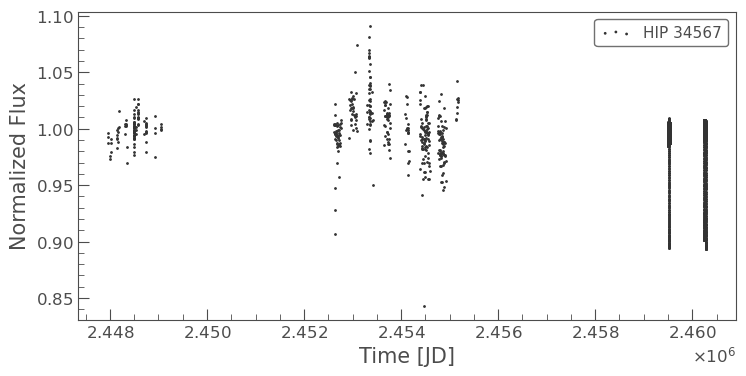

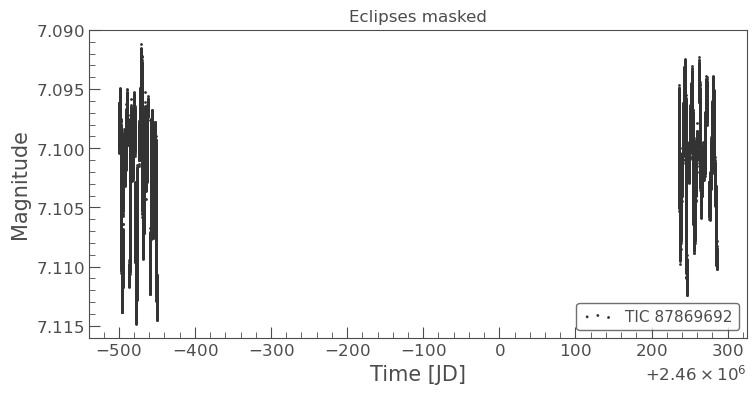

In [86]:
lc = lke.stitch_lc_dict(lc_combined_dict).remove_nans().remove_nans(column="flux_err")
ax = tplt.scatter(lc);

lc_combined_dict_no_ecl = dict()
for key, _lc in lc_combined_dict.items():
    tmask = _lc.create_transit_mask(period=period_final, transit_time=epoch_time_hjd_final, duration=duration_hr_min_i_final/24 * 1.4)
    tmask2 = _lc.create_transit_mask(period=period_final, transit_time=epoch_time_min_ii_hjd_final, duration=duration_hr_min_ii_final/24 * 1.4)
    _lc = _lc[~tmask & ~tmask2]
    lc_combined_dict_no_ecl[key] = _lc

    
lc = lc_combined_dict_no_ecl["TESS"].remove_nans().remove_nans(column="flux_err")  # TESS only, the error of ASAS data is too great
# lc = lke.stitch_lc_dict(lc_combined_dict_no_ecl).remove_nans().remove_nans(column="flux_err")  
ax = tplt.scatter(lc);
ax.set_title("Eclipses masked");

In [87]:
pg = (
    lc
    # lke.to_normalized_flux_from_mag(lc_tess)
    .to_periodogram(method="lombscargle",
                    # use the frequency grid from TESS data only (otherwise we hit some IndexError from lightkurve / astropy)
                    # add 10x to be more precise
                    frequency=u.Quantity(np.linspace(0.00025466, 359.96945865, num=1413505 * 10 ), unit=1/u.d),
                    # minimum_period=0.5, maximum_period=100,
                    # oversample_factor=50,  # default: 5
                      )
     )
print(len(lc), lc.time.max() - lc.time.min(), lc.time.min(), lc.time.max(), )
pg.show_properties();

print("period_at_max_power:", pg.period_at_max_power, "/", pg.frequency_at_max_power.to(u.microhertz))


60431 785.3471821104176 2459500.2392227706 2460285.586404881
lightkurve.Periodogram properties:
      Attribute           Description    Units
---------------------- ----------------- -----
                nterms                 1      
              targetid          87869692      
          default_view         frequency      
                 label      TIC 87869692      
             ls_method              fast      
frequency_at_max_power            0.1077 1 / d
             max_power            0.0048   mag
               nyquist          359.9696 1 / d
   period_at_max_power            9.2875     d
             frequency array (14135050,) 1 / d
                period array (14135050,)     d
                 power array (14135050,)   mag
                  meta    <class 'dict'>      
period_at_max_power: 9.287461132355778 d / 1.2462043080591922 uHz


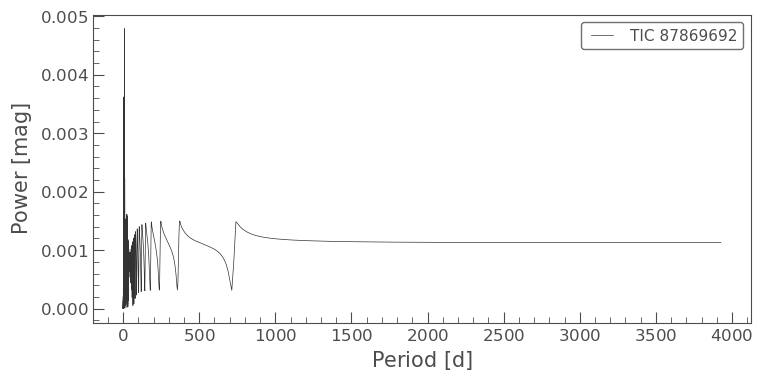

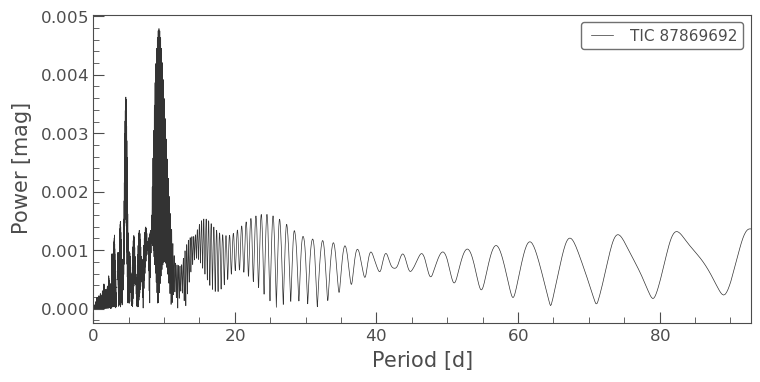

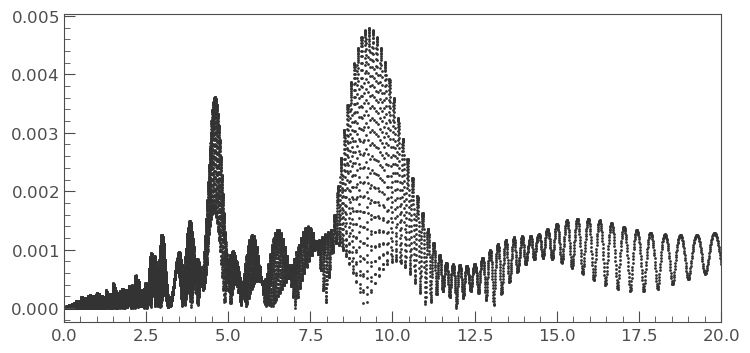

In [89]:
ax = pg.plot(view="period"); 

ax = pg.plot(view="period"); 
ax.set_xlim(0, pg.period_at_max_power.value * 10);

ax = tplt.lk_ax()
ax.scatter(pg.period.value, pg.power.value, s=1);
ax.set_xlim(0, 20);

In [90]:
# reload(lke_pg)
peaks = lke_pg.find_peaks(
    pg, 
    # pg[pg.frequency < 500 * u.microhertz], 
    powerlimit=10**-4,   
)
if "period" not in peaks.columns:
    peaks["period"] = 1 / peaks["frequency"]
    peaks["period"].unit = 1 / peaks["frequency"].unit
if "frequency" not in peaks.columns:
    peaks["frequency"] = 1 / peaks["period"]
    peaks["frequency"].unit = 1 / peaks["period"].unit
peaks["frequency_u"] = u.Quantity(peaks["frequency"]).to(u.microhertz)  # in microhertz, for log scale plot
peaks["period_h"] = u.Quantity(peaks["period"]).to(u.hour)  # period in hours
peaks["rank"] = np.linspace(1, len(peaks), len(peaks), dtype=int)

peaks[peaks["period"] > 0][:15]
# peaks[peaks["frequency"] > 100][:15]  # in 1/d
# peaks[peaks["frequency_u"] > 200][:15]
# peaks[peaks["frequency_ratio"] < 5][:15]
# peaks[(1.4 < peaks["period"]) & (peaks["period"] < 1.6)][:15]
# peaks[(100 < peaks["frequency_u"]) & (peaks["frequency_u"] < 500)][:15]
# peaks[:15]

power,frequency,prominence,lower_hwhm,upper_hwhm,fwhm,frequency_ratio,period,frequency_u,period_h,rank
mag,1 / d,,1 / d,1 / d,1 / d,,d,uHz,h,
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int32
0.0047896056580375495,0.1076720522163142,0.004780521736159937,-0.00044857,+0.00045826,0.00090684,1.000,9.287461132355778,1.2462043080591922,222.89906717653867,1
0.0047520631100239855,0.10902177288664723,0.004647910529989565,-0.00043955,+0.00045688,0.00089643,0.988,9.172479712283948,1.2618260750769357,220.13951309481476,2
0.004637184419142715,0.11037149355698024,0.004543808608460207,-0.00043542,+0.00046215,0.00089757,0.976,9.060310482105974,1.2774478420946787,217.44745157054336,3
0.00474974578737242,0.1063223315459812,0.004477571279024034,-0.0004378,+0.00044222,0.00088002,1.013,9.40536184129418,1.230582541041449,225.72868419106032,4
0.004634901768504833,0.10497261087564819,0.0042066156576314505,-0.00043055,+0.00043318,0.00086373,1.026,9.52629444631621,1.2149607740237058,228.63106671158906,5
0.004449633701082552,0.11174668065505539,0.004178350977318724,-0.00044548,+0.00043233,0.00087781,0.964,8.948811670628897,1.2933643594335114,214.77148009509352,6
0.00445059863573604,0.10362289020531516,0.0038930537654051343,-0.00042182,+0.00042683,0.00084865,1.039,9.650377421616316,1.1993390070059626,231.60905811879158,7
0.004190611792085754,0.1130964013253884,0.003740719771963265,-0.00042844,+0.00042766,0.0008561,0.952,8.842014319473448,1.3089861264512546,212.20834366736273,8


In [70]:
# ax = tplt.lk_ax(figsize=(12, 4))
# ax.scatter(pg.period.value, pg.power.value, s=1);
# ax.set_xlim(12, 19);
# ax.axvline(pg.period_at_max_power.value, color="blue", linestyle="--");
# ax.axvline(14.91, color="red", linestyle="--");  # VSX value
# ax.axvline(14.799471, color="green", linestyle="--");  # a sub-peak 
# ax.axvline(15.455404, color="green", linestyle="--");  # a sub-peak 
# ax.axvline(15.783312, color="green", linestyle="--");  # a sub-peak 



Final adopted rot_period_trial: 9.287461132355778


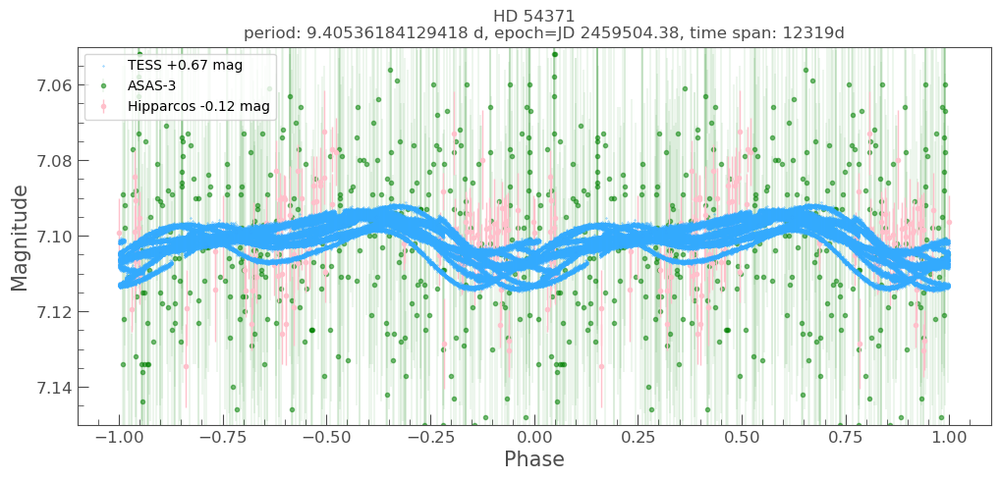

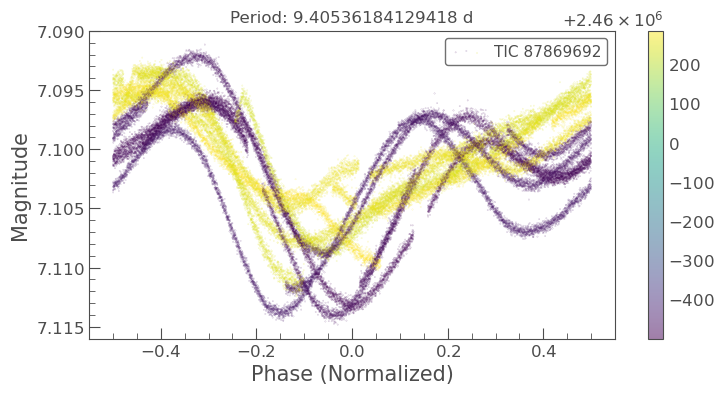

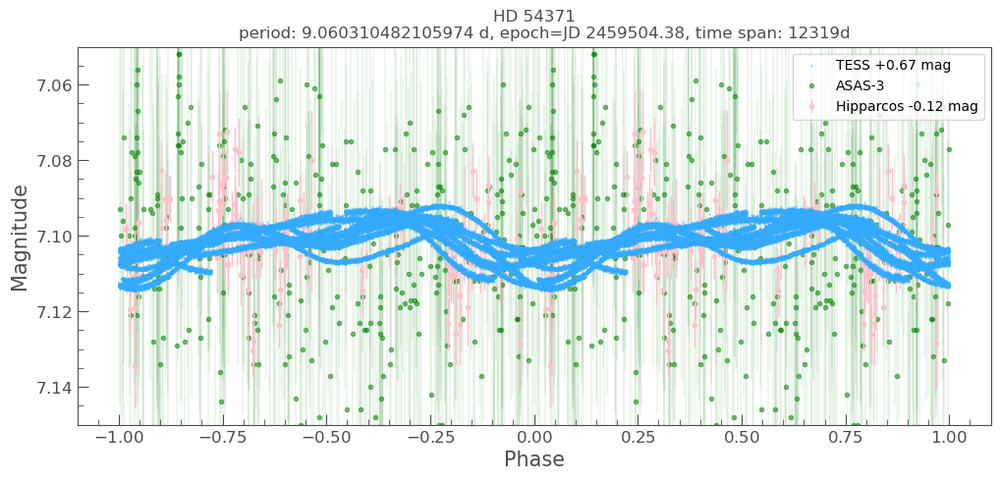

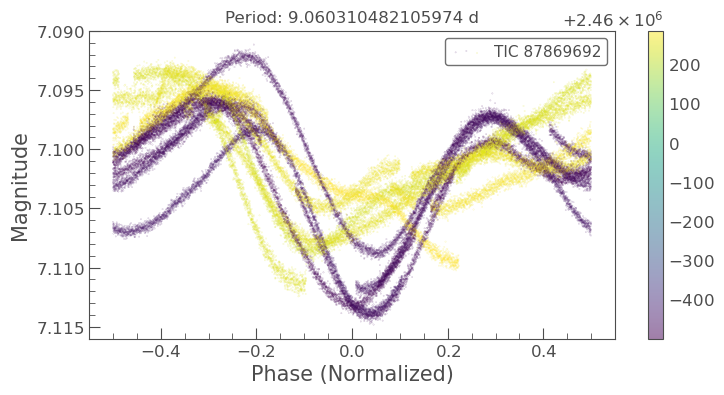

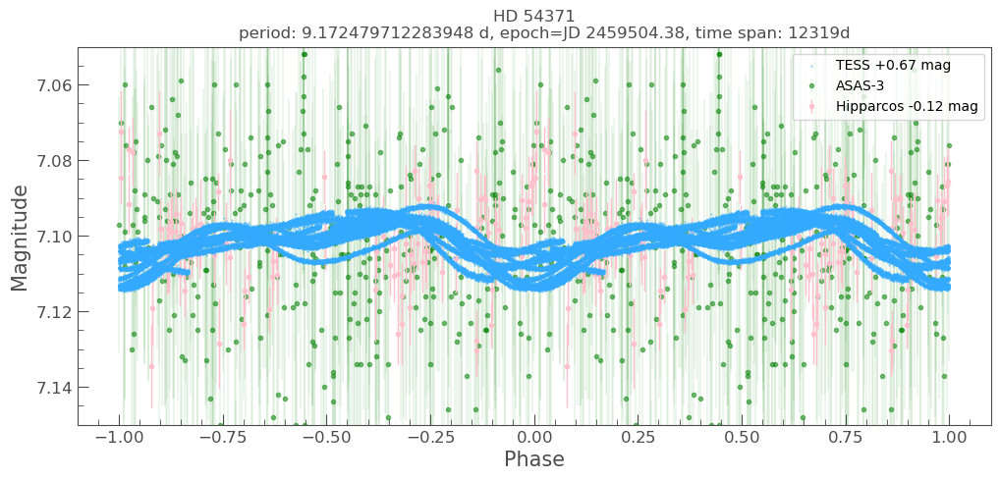

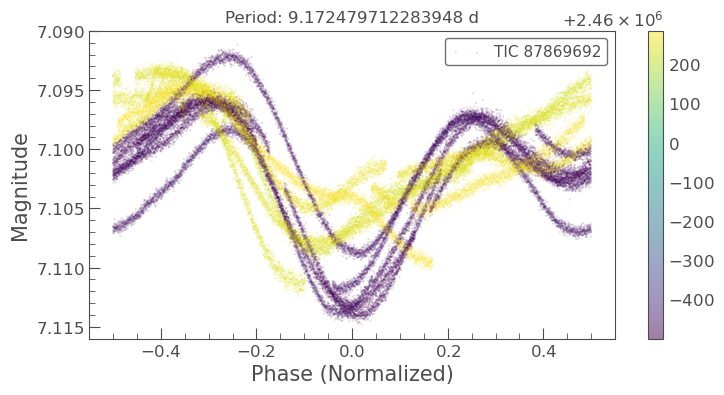

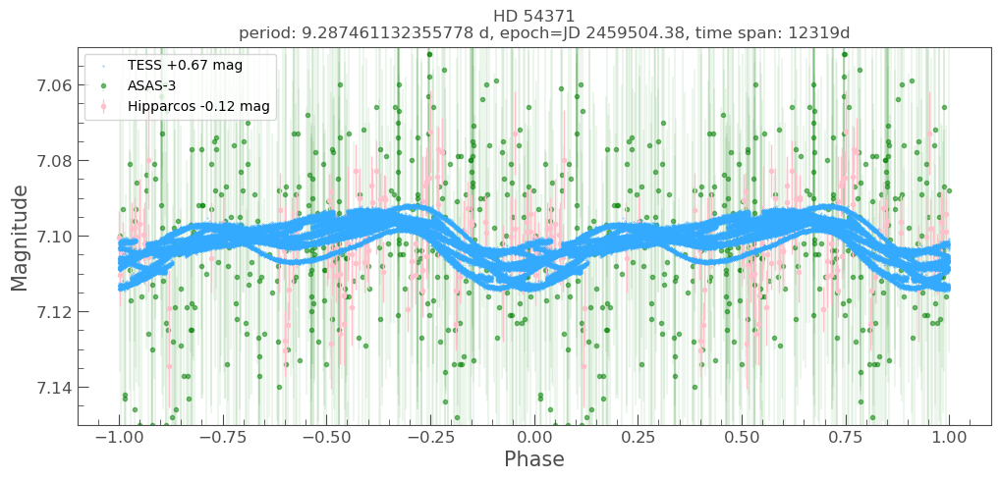

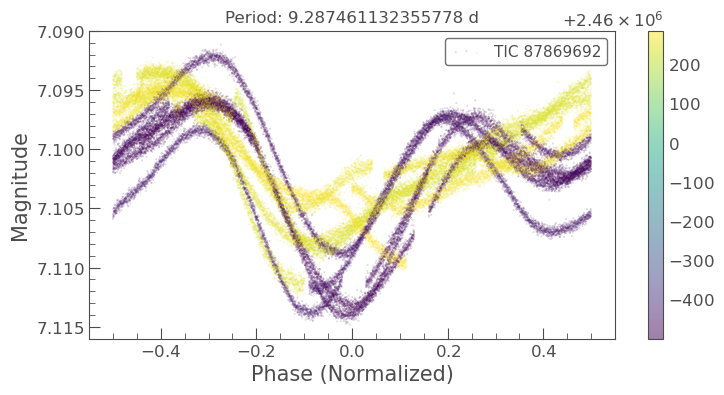

In [92]:
plot_options = lkem.get_default_plot_multi_bands_options_copy()
plot_options[0][1]["zorder"] = 9  # push TESS data to the top
plot_options[1][1]['linewidth'] = 0.2
plot_options[1][1]['alpha'] = 0.5
plot_options[2][1]['linewidth'] = 1
plot_options[2][1]['zorder'] = 8

for rot_period_trial in [
    # LS values from combined LC
    # 9.394105440953693, # LS sub-peak 4
    # 8.944729080830653, # LS sub-peak 3 
    # 9.530912807533031, # LS sub-peak 2
    # 9.283064000905098, # LS peak , the best among them

    # LS values from TESS only LcC
    9.40536184129418, # LS sub-peak 4
    9.060310482105974, # LS sub-peak 3 
    9.172479712283948, # LS sub-peak 2
    9.287461132355778, # LS peak , the best among them
]: 
    rot_epoch_time_hjd_trial = 2459504.38  #  round(lket.btjd_to_hjd_utc(2504.38, target_coord), 2)  # inspection in TESS lC
    
    ax, lc_f_res = lkem.fold_n_plot_multi_bands(
        lc_combined_dict_no_ecl,
        period=rot_period_trial,
        epoch=Time(rot_epoch_time_hjd_trial, format="jd", scale="utc"),
        phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1    
        figsize=(12, 5),
        target_name=primary_name,
        plot_options=plot_options,
    );
    ax.set_ylim(7.15, 7.05)

    _lc = lc_f_res["TESS"]
    ax = tplt.scatter(_lc, s=0.1, alpha=0.5, c=_lc.time_original.value);
    ax.set_title(f"Period: {_lc.period}");

print("Final adopted rot_period_trial:", rot_period_trial)

Final adopted rot_period_trial: 9.287461132355778


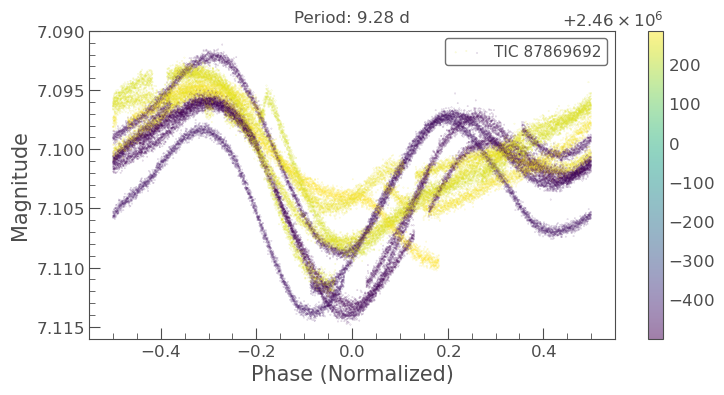

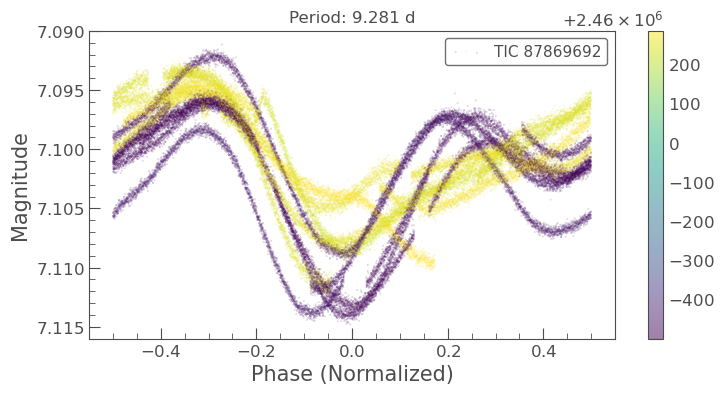

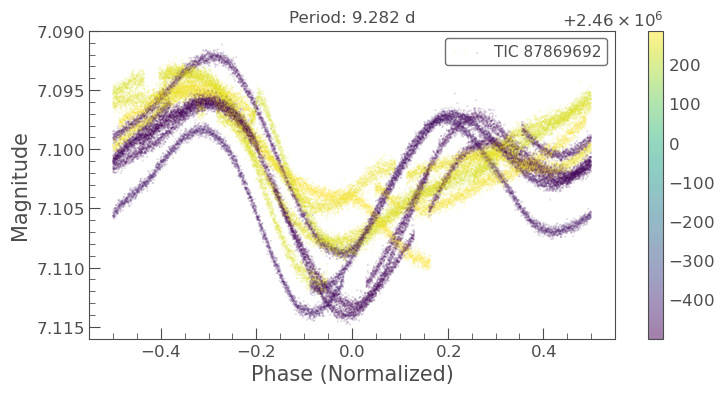

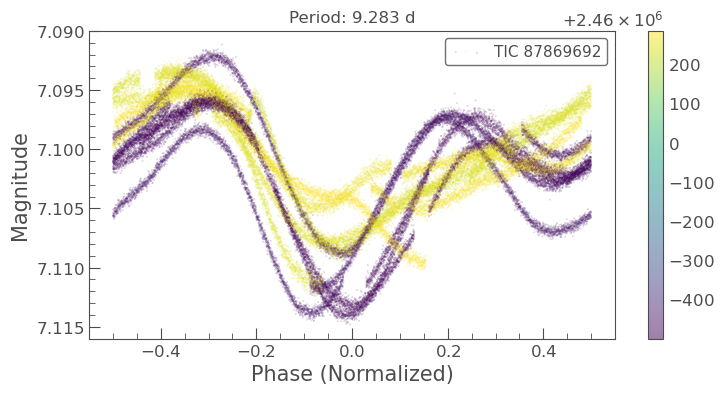

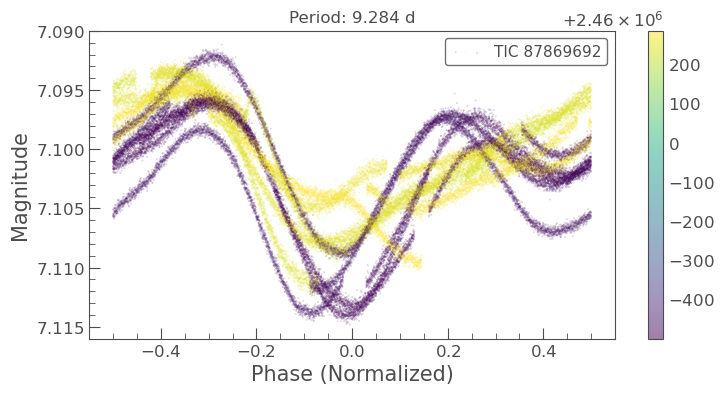

...

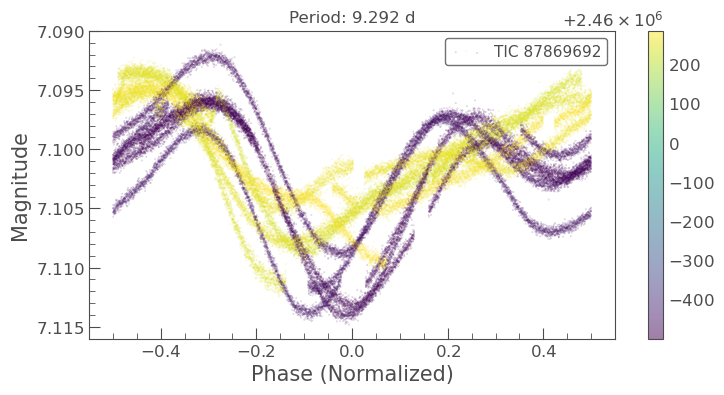

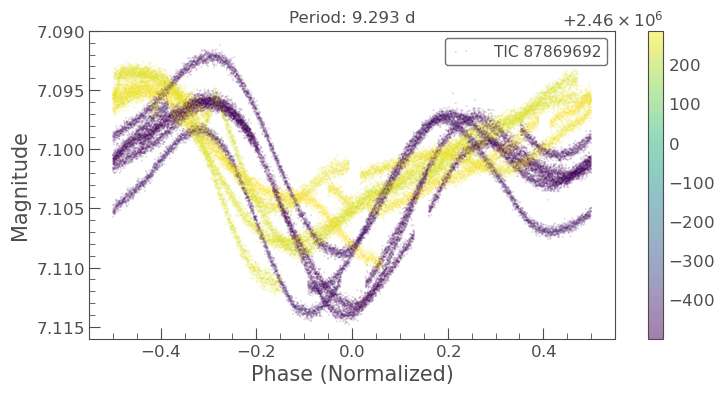

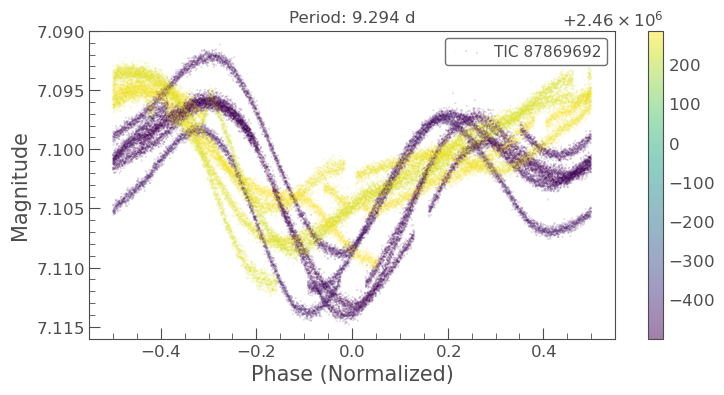

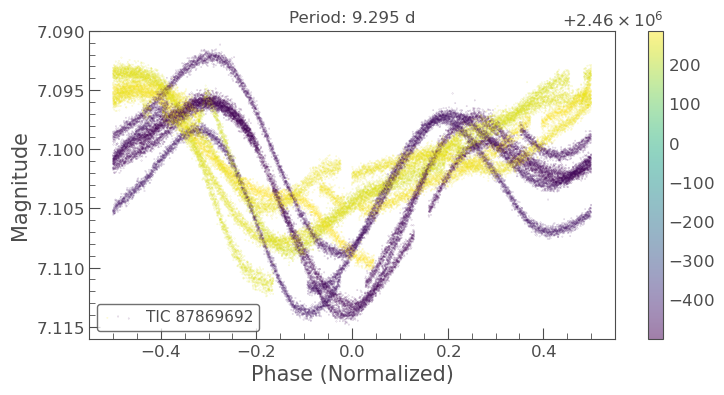

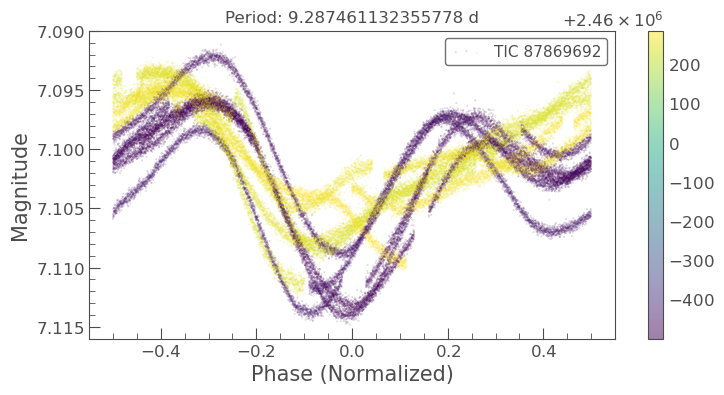

In [113]:
plot_options = lkem.get_default_plot_multi_bands_options_copy()
plot_options[0][1]["zorder"] = 9  # push TESS data to the top
plot_options[1][1]['linewidth'] = 0.2
plot_options[1][1]['alpha'] = 0.5
plot_options[2][1]['linewidth'] = 1
plot_options[2][1]['zorder'] = 8

for rot_period_trial in [
    # manuall search around LS peak
    9.280,
    9.281,
    9.282,
    9.283,
    9.284,
    9.285,
    9.286,
    9.287,
    9.288,
    9.289,
    9.290,
    9.291,
    9.292,
    9.293,
    9.294,
    9.295,
    9.287461132355778, # LS global peak
]: 
    rot_epoch_time_hjd_trial = 2459504.38  #  round(lket.btjd_to_hjd_utc(2504.38, target_coord), 2)  # inspection in TESS lC
    
    _lc = lc_combined_dict_no_ecl["TESS"].fold(epoch_time=rot_epoch_time_hjd_trial, period=rot_period_trial, normalize_phase=True)
    ax = tplt.scatter(_lc, s=0.1, alpha=0.5, c=_lc.time_original.value);
    ax.set_title(f"Period: {_lc.period}");

print("Final adopted rot_period_trial:", rot_period_trial)

Final adopted rot_period_trial: 9.28


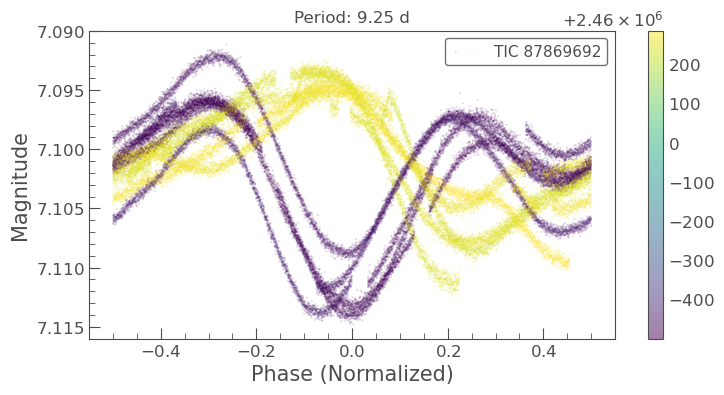

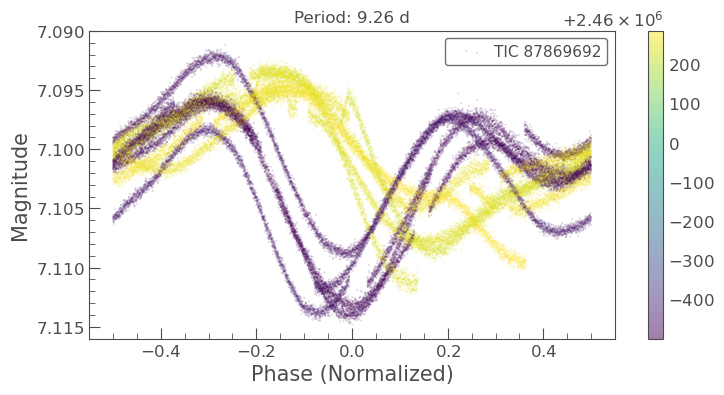

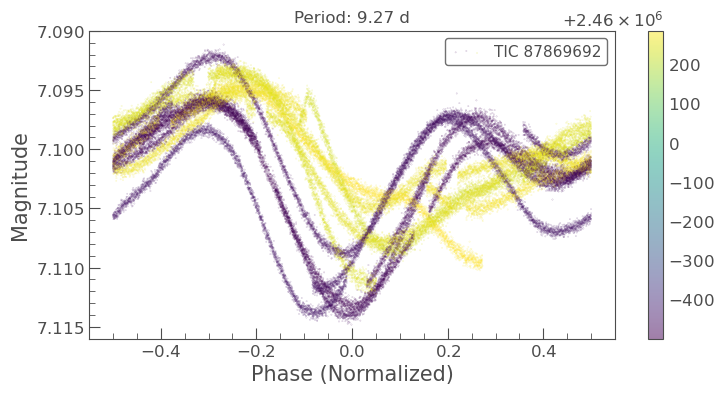

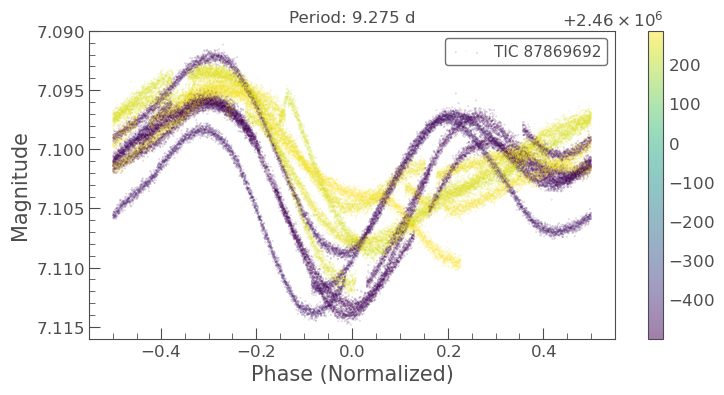

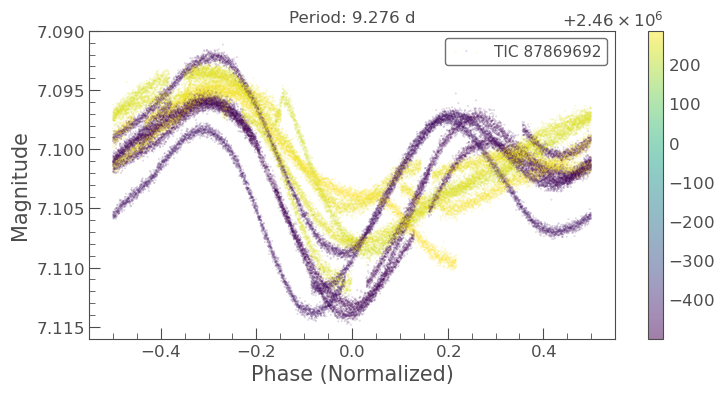

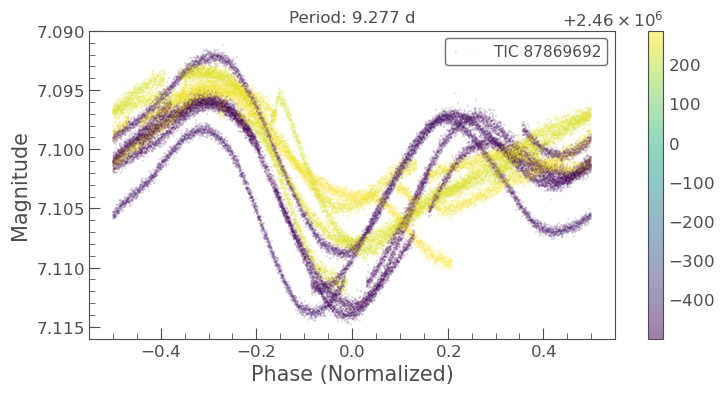

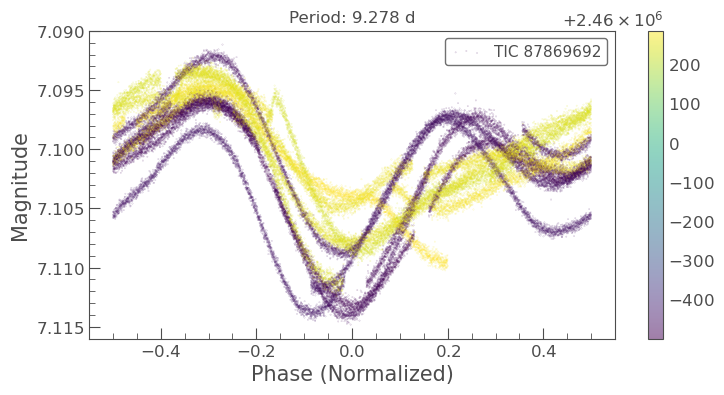

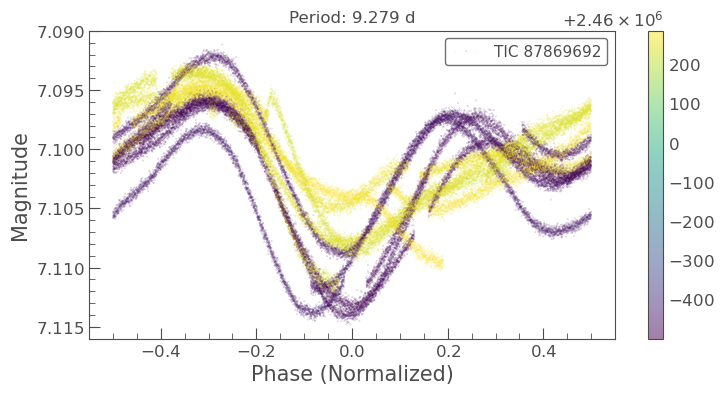

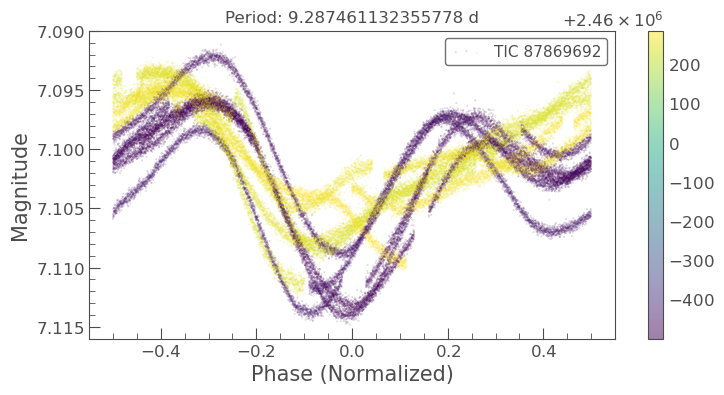

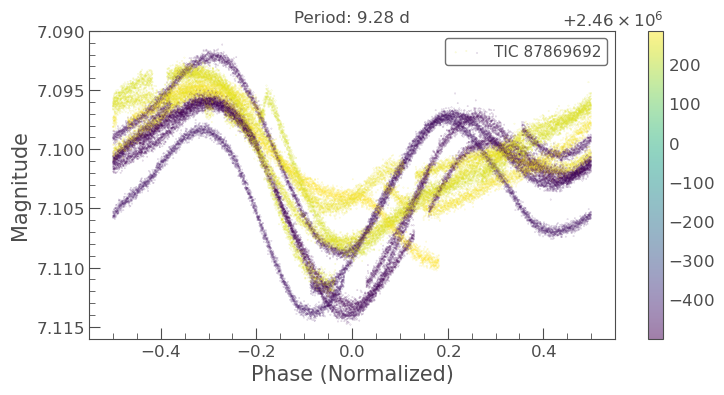

In [138]:
plot_options = lkem.get_default_plot_multi_bands_options_copy()
plot_options[0][1]["zorder"] = 9  # push TESS data to the top
plot_options[1][1]['linewidth'] = 0.2
plot_options[1][1]['alpha'] = 0.5
plot_options[2][1]['linewidth'] = 1
plot_options[2][1]['zorder'] = 8

for rot_period_trial in [
    # manuall search around LS peak
    9.25,
    9.26,
    9.27,
    9.275,
    9.276,
    9.277,
    9.278,
    9.279,
    9.287461132355778, # LS global peak
    9.280,  # this seem to fit better than LS peak, the min in recent sectros algined with the earlier sectors better
]: 
    rot_epoch_time_hjd_trial = 2459504.38  #  round(lket.btjd_to_hjd_utc(2504.38, target_coord), 2)  # inspection in TESS lC
    
    _lc = lc_combined_dict_no_ecl["TESS"].fold(epoch_time=rot_epoch_time_hjd_trial, period=rot_period_trial, normalize_phase=True)
    ax = tplt.scatter(_lc, s=0.1, alpha=0.5, c=_lc.time_original.value);
    ax.set_title(f"Period: {_lc.period}");

print("Final adopted rot_period_trial:", rot_period_trial)

#### Refine the ROT period with MCMC

- not quite precise: the `cosh` Gaussian model is symmetric in shape, while the ROT is not quite

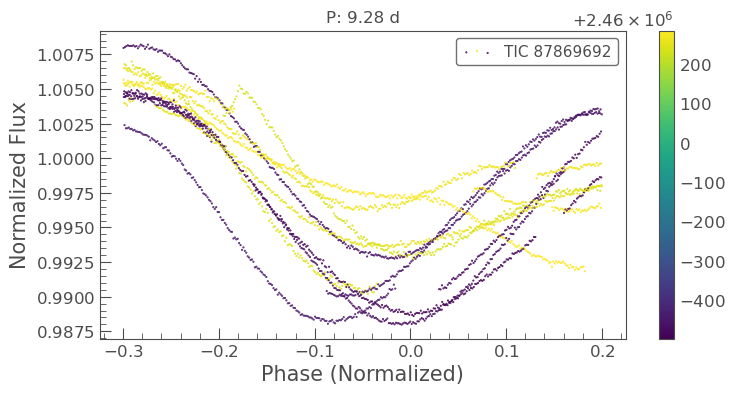

In [140]:
# _lc = lke.to_normalized_flux_from_mag(lc_combined_dict_no_ecl["TESS"].remove_nans())
_lc_binned = lke.bin_flux(lc_combined_dict_no_ecl["TESS"], time_bin_size=20*u.min)   # bin the data from 2 min to 20min , to make MCMC run faster. Without binning, it runs at 1.5 it/s - 0.5 it/s
_lc = lke.to_normalized_flux_from_mag(_lc_binned.remove_nans().remove_nans(column="flux_err"))

_lc_f_rot_min_i = _lc.fold(epoch_time=rot_epoch_time_hjd_trial, period=rot_period_trial, normalize_phase=True)
_lc_f_rot_min_i = _lc_f_rot_min_i.truncate(-0.3, 0.2)
ax1 = tplt.scatter(_lc_f_rot_min_i, c=_lc_f_rot_min_i.time_original.value, s=1);
# ax1 = tplt.errorbar(_lc_f_rot_min_i);
ax1.set_title(f"P: {_lc_f_rot_min_i.period}");


In [141]:
from types import SimpleNamespace

import sys
if "../eb_with_diff_sb_period/etv/" not in sys.path:  # for etvp
    sys.path.append("../eb_with_diff_sb_period/etv/")

import etv_functions_with_period as etvp
import etv_functions
# reload(etv_functions)

lc_f = _lc_f_rot_min_i

# # median flux, -eclipse depth, t0, related to duration, related to shape (U or V) 
# # t0 in normalized phase
start_vals = [1.0, -0.01, 0, 0.13, 1.1]

# convert lc to the form needed by fit etv_functions
lc_f_data = SimpleNamespace(time=lc_f.time_original.value, phase=lc_f.time.value, flux=np.array(lc_f.flux.value), err=np.array(lc_f.flux_err.value))
etv_functions.plot_initial_guess_interactive(lc_f_data, None, None, None, "0", *start_vals)

Output(layout=Layout(padding='1em 0px'), outputs=({'output_type': 'display_data', 'data': {'text/plain': '<Fig…

Output(layout=Layout(padding='1em'), outputs=({'name': 'stdout', 'text': '[1.0, -0.01, 0, 0.13, 1.1]\n\n', 'ou…

100%|██████████████████████████████████████████████████████████| 2000/2000 [02:53<00:00, 11.51it/s]
The chain is shorter than 20 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/20 = 100;
tau: [ 37.94781622  36.43371207 162.87228311  97.50622255 205.5836347
 129.73119223]


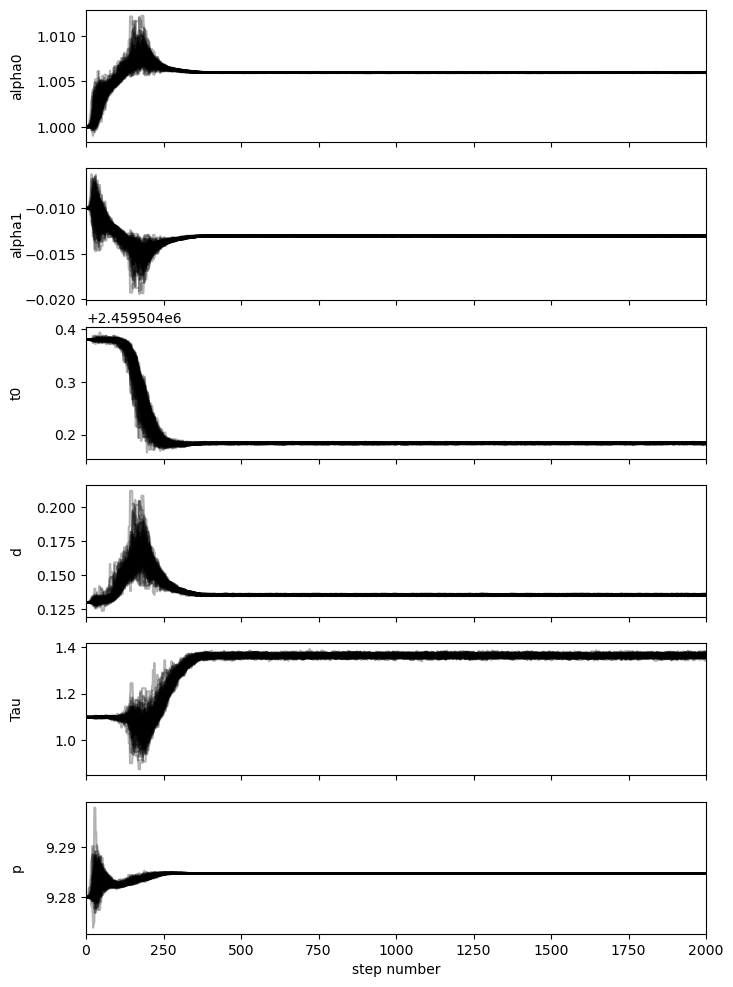

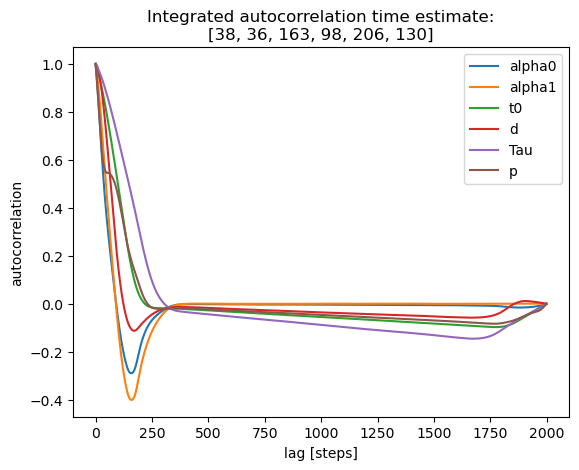

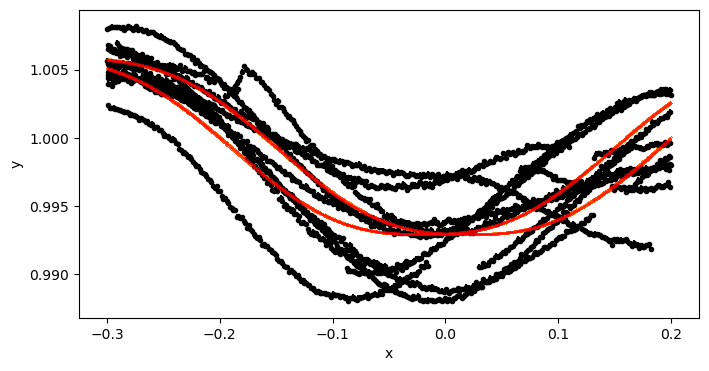

mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = 1.0059642040600938, -0.013036381444707104, 2459504.183703059, 0.13558205155309877, 1.3623169489873326, 9.284750227302542
std_t0: 0.0007891489533386432
std_p: 1.5461490307462e-05


In [142]:
mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p, fit_params_p_stats  = etvp.run_mcmc_initial_fit_p(
    lc_f_data, 
    [1.0, -0.01, rot_epoch_time_hjd_trial, 0.13, 1.1, rot_period_trial],
    # nruns=20, discard=1,
    # nruns=1000, discard=400,
    nruns=2000, discard=1000,
    autocorr_time_kwargs=dict(tol=20),  # the emcee defaults tol=50 seems to be too strict for our use case, tol of ~10 - 20 seems to be sufficient    
    pool=-2,
    plot_chains=True, plot_autocorrelation=True, plot=True, 
    also_return_stats=True,
)

print("mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p]]))
print("std_t0:", fit_params_p_stats["std_t0"])
print("std_p:", fit_params_p_stats["std_p"])


In [ ]:
# Note: the better period from MCMC, 2.9212, is missing in the LS frequency grid
_p = 1 / pg.frequency.value  # in days
_p[(2.920 < _p) & (_p < 2.922)]

In [ ]:
# for rot_period_trial in np.linspace(14.85, 14.95, num=11): 
#     rot_epoch_time_hjd_trial = 2453069.6  # VSX
    
#     ax, lc_f_res = lkem.fold_n_plot_multi_bands(
#         lc_combined_dict,
#         period=rot_period_trial,
#         epoch=Time(rot_epoch_time_hjd_trial   , format="jd", scale="utc"),
#         phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1    
#         figsize=(12, 5),
#         target_name=primary_name,
#         plot_options=plot_options,
#     );
#     ax.set_ylim(9.2, 8.75);


In [ ]:
# the best period seems to be around 14.913 - 14.914
# export combined data for period analysis outside the notebook

# lc = lke.stitch_lc_dict(lc_combined_dict, normalize=False)
# lc = lc.truncate(None, 9.2, column="flux")
# ax = tplt.scatter(lc);
# lc.to_pandas().to_csv(f"{lk_download_dir}/tmp_in/tic385464250_tess_asas3.csv")


In [ ]:
# for rot_period_trial in [  # peaks from # VStar ANOVA
#     14.91382,
#     14.91383,
#     14.91384,
#     14.91385,
#     14.91371,
#     14.91374,
#     14.91376,
#     14.91373,
# ]: 

#     rot_epoch_time_hjd_trial = 2456321.94  # VStar ANOVA
    
    
#     ax, lc_f_res = lkem.fold_n_plot_multi_bands(
#         lc_combined_dict,
#         period=rot_period_trial,
#         epoch=Time(rot_epoch_time_hjd_trial   , format="jd", scale="utc"),
#         phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1    
#         figsize=(12, 5),
#         target_name=primary_name,
#         plot_options=plot_options,
#     );
#     ax.set_ylim(9.2, 8.75);



#### Trial to determine the period using Multiband Lomb-Scargle (skipped)

https://docs.astropy.org/en/stable/timeseries/lombscarglemb.html

In [ ]:
from astropy.timeseries import LombScargleMultiband

lc = lke.stitch_lc_di#ct(lc_combined_dict).remove_nans().remove_nans(column="flux_err")
lc = lc.truncate(0.8, None, column="flux")
tplt.scatter(lc)

lsm = LombScargleMultiband(lc.time, lc.flux, lc.source, lc.flux_err)
lsm

In [ ]:
%%time

# lsm.autopower(method="flexible") , aka, the default, takes forever to run, see if I can get some approx results sooner

frequency = lsm.autofrequency()
period = 1 / frequency
power = lsm.power(frequency, method="fast")
len(power), np.max(power), period[np.argmax(power)], frequency[np.argmax(power)]

In [ ]:
%%time

# lsm.autopower(method="flexible") , aka, the default, takes forever to run, see if I can get some approx results sooner

# use the frequency grid from TESS data only in plain LS
frequency = u.Quantity(np.linspace(8.96e-5, 215.99, num=2410189), unit=1/u.d)
period = 1 / frequency
power = lsm.power(frequency, method="fast")
print(len(power), np.max(power), period[np.argmax(power)], frequency[np.argmax(power)])
print(np.mean(np.diff(frequency)))

In [ ]:
%%time

# lsm.autopower(method="flexible") , aka, the default, takes forever to run, see if I can get some approx results sooner

# use a much narrower frequency range , but the grid spacing is about the same as the one used in plain LS
frequency = u.Quantity(np.arange(1/30, 1/2, step=8.962e-5), unit=1/u.d)  
print("num. freq:", len(frequency))
period = 1 / frequency
power = lsm.power(frequency, method="flexible")  # the default, takes longer than method="fast"
len(power), np.max(power), period[np.argmax(power)], frequency[np.argmax(power)]

In [ ]:
ax = tplt.lk_ax();
ax.plot(period, power); ax.set_xlabel("period [d]"), ax.set_ylabel("Power");

ax = tplt.lk_ax();
ax.plot(period, power); ax.set_xlabel("period [d]"), ax.set_ylabel("Power");
ax.set_xlim(12, 19);
ax.set_title(f"Peak period: {period[np.argmax(power)]}")
ax.axvline(period[np.argmax(power)].value, color="blue", linestyle="--");

ax = tplt.lk_ax();
ax.plot(period, power); ax.set_xlabel("period [d]"), ax.set_ylabel("Power");
ax.scatter(period, power);
ax.set_xlim(14, 16);
ax.set_title(f"Peak period: {period[np.argmax(power)]}")
ax.axvline(period[np.argmax(power)].value, color="blue", linestyle="--");

# The period tried
period[(14.75 < period.value) & (period.value < 15.25)]

In [ ]:
%%time

# use a much narrower frequency range , but the grid spacing is finer (smaller step size)
frequency = u.Quantity(np.arange(1/25, 1/5, step=8.962e-5 / 5), unit=1/u.d)  
print("num. freq:", len(frequency))
period = 1 / frequency
power = lsm.power(frequency, method="flexible")  # the default, takes longer than method="fast"
len(power), np.max(power), period[np.argmax(power)], frequency[np.argmax(power)]

In [ ]:
ax = tplt.lk_ax();
ax.plot(period, power); ax.set_xlabel("period [d]"), ax.set_ylabel("Power");

ax = tplt.lk_ax();
ax.plot(period, power); ax.set_xlabel("period [d]"), ax.set_ylabel("Power");
ax.set_xlim(12, 19);
ax.set_title(f"Peak period: {period[np.argmax(power)]}")
ax.axvline(period[np.argmax(power)].value, color="blue", linestyle="--");

ax = tplt.lk_ax();
ax.plot(period, power); ax.set_xlabel("period [d]"), ax.set_ylabel("Power");
ax.scatter(period, power);
ax.set_xlim(14, 16);
ax.set_title(f"Peak period: {period[np.argmax(power)]}")
ax.axvline(period[np.argmax(power)].value, color="blue", linestyle="--");

# The period tried
period[(14.85 < period.value) & (period.value < 15.15)]

### Final rotation epoch / period

In [154]:
np.nanmedian(lc_combined_dict_no_ecl["Hipparcos"].flux_err)

<Quantity 0.008 mag>

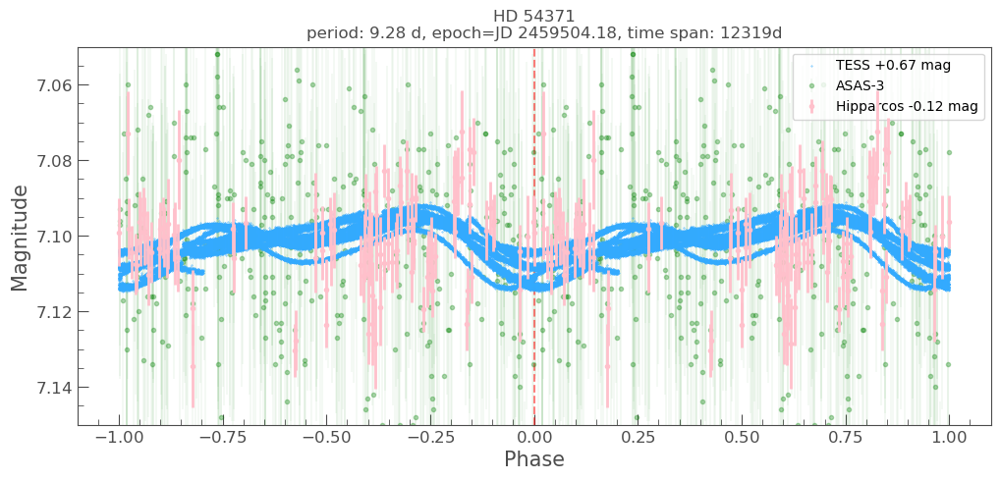

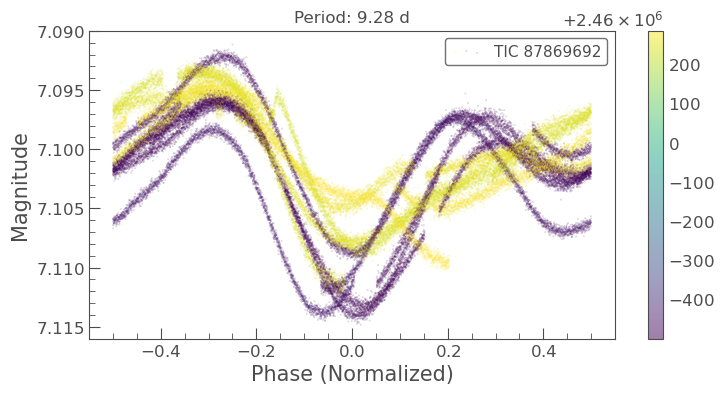

In [215]:
rot_period_final = 9.28  # visually 2 decimals is  enough.  # MCMC: 9.284750227302542,  # LSL 9.287461132355778
rot_epoch_time_hjd_final = 2459504.18  # MCMC: 2459504.183703059, # manaul: 2459504.38


ax, lc_f_res = lkem.fold_n_plot_multi_bands(
    lc_combined_dict_no_ecl,
    period=rot_period_final, # shorter period, around 2.9207, would make MASCARA and TESS data fit better, but at the expanse of Hipparocos, and TESS-only data
    epoch=Time(rot_epoch_time_hjd_final   , format="jd", scale="utc"),
    phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1    
    figsize=(12, 5),
    target_name=primary_name,
    plot_options=plot_options,
);
ax.axvline(0, color="red", alpha=0.5, linestyle="--");
ax.set_ylim(7.15, 7.05);

_lc = lc_f_res["TESS"]
ax = tplt.scatter(_lc, s=0.1, alpha=0.5, c=_lc.time_original.value);
ax.set_title(f"Period: {_lc.period}");

## Amplitudes

### Overall amplitude and eclipse amplitudes (TESS)

Absolute max: 7.0911517 , 99.5 percentile: 7.0924811363220215
Min I mag # num data points: 15
Min II mag # num data points: 5
['7.1010', '7.2216', '7.1060', '7.1170']
(0.12, 0.01, 0.13)


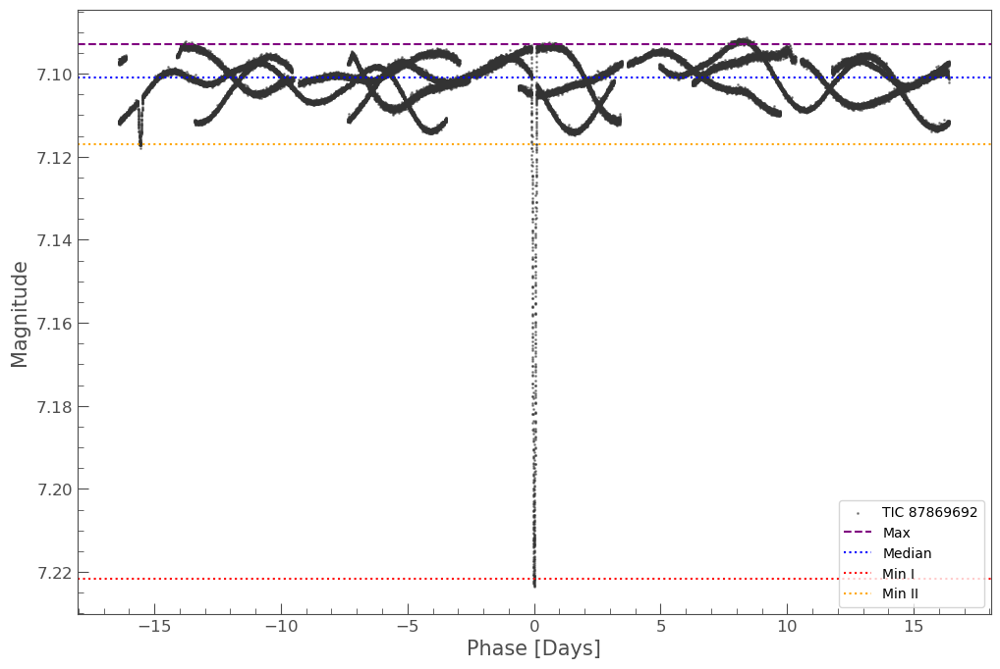

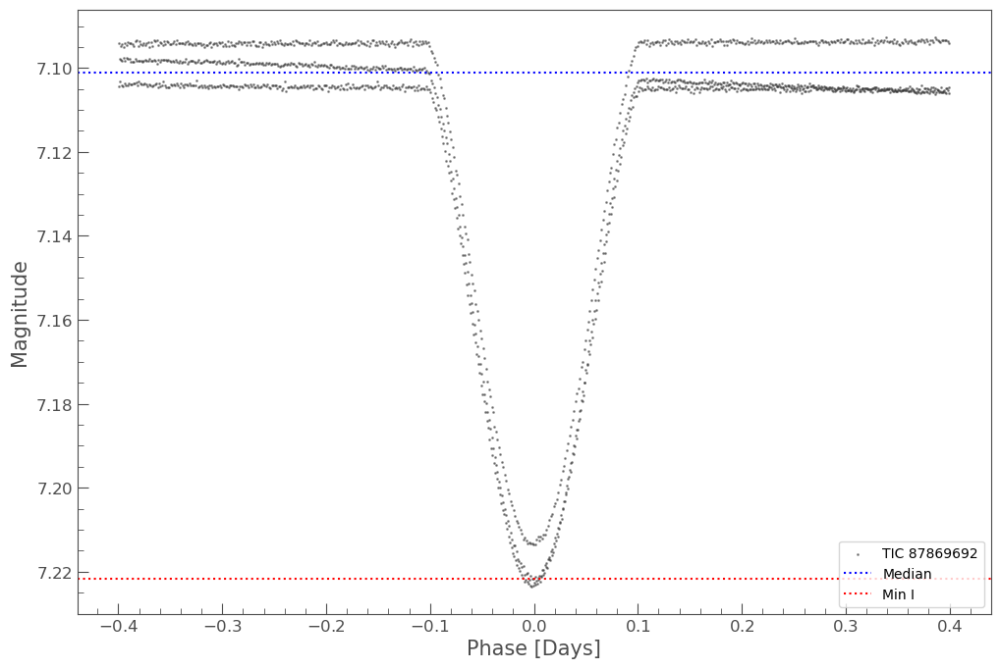

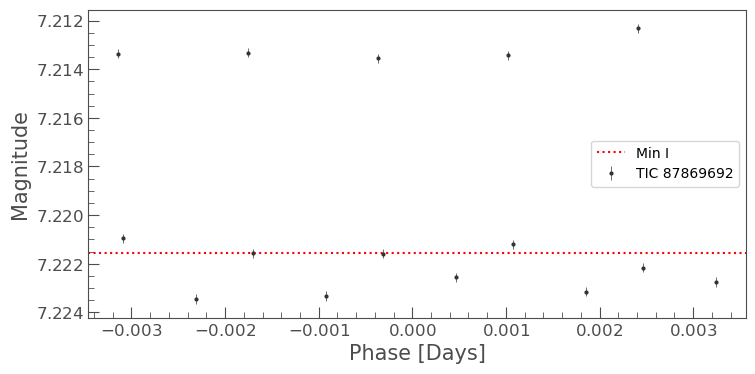

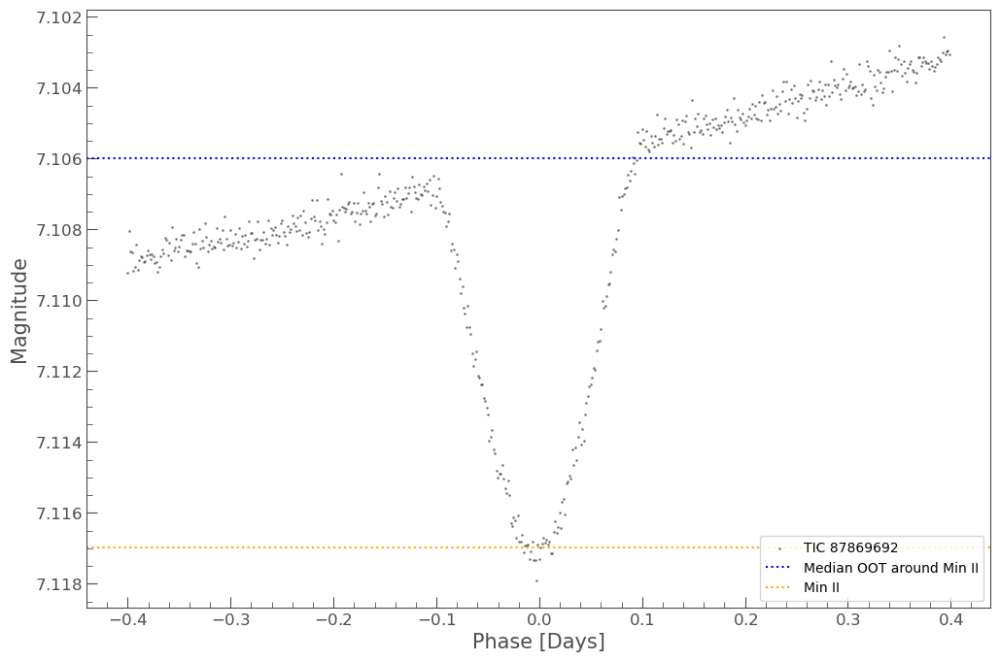

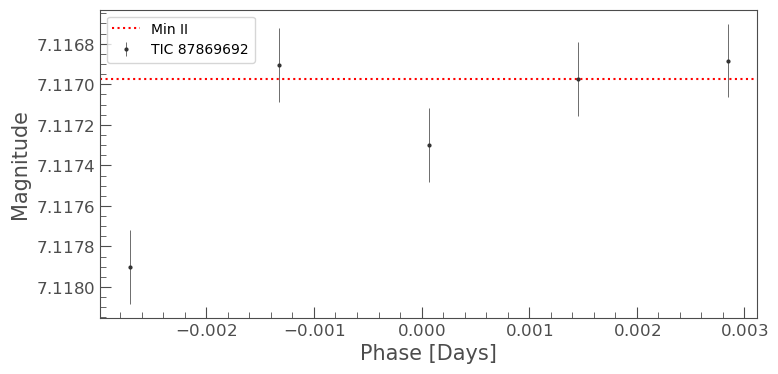

In [190]:
%matplotlib inline

lc = lc_combined_dict["TESS"]

median_flux_mag = np.nanmedian(lc.flux.value)
# median_flux_mag = 8.392  # visual override that fits better as the mag before / after eclipes

# lc_zoom_max = lc.fold(epoch_time=epoch_time_hjd_final + 4.31, period=period_final).truncate(0 - 5 /24/60, 0 + 5 /24/ 60)  # the offset is from above cell
# print("Max mag # num data points:", len(lc_zoom_max))
# max_flux_mag = np.nanmedian(lc_zoom_max.flux.value)
print("Absolute max:", np.nanmin(lc.flux.value), ", 99.5 percentile:", np.nanpercentile(lc.flux.value, 0.5))
max_flux_mag = 7.093  # visual 

lc_zoom_min = lc.fold(epoch_time=epoch_time_hjd_final, period=period_final).truncate(0 - 5 /24/60, 0 + 5 /24/ 60)
print("Min I mag # num data points:", len(lc_zoom_min))
min_flux_mag = np.nanmedian(lc_zoom_min.flux.value)


oot_min_ii_flux_mag = 7.1060  # the median surrounding Min II, to calc Min II amp
lc_zoom_min_ii = lc.fold(epoch_time=epoch_time_min_ii_hjd_final, period=period_final).truncate(0 - 5 /24/60, 0 + 5 /24/ 60)
print("Min II mag # num data points:", len(lc_zoom_min_ii))
min_ii_flux_mag = np.nanmedian(lc_zoom_min_ii.flux.value)


# overall 
lc_f = lc.fold(epoch_time=epoch_time_hjd_final, period=period_final)
ax = tplt.lk_ax(figsize=(12, 8))
ax = tplt.scatter(lc_f, ax=ax, alpha=0.5);
ax.axhline(max_flux_mag, c="purple", linestyle="--", label="Max")
ax.axhline(median_flux_mag, c="blue", linestyle="dotted", label="Median")
ax.axhline(min_flux_mag, c="red", linestyle="dotted", label="Min I")
ax.axhline(min_ii_flux_mag, c="orange", linestyle="dotted", label="Min II")
ax.legend(loc="lower right");
# ax.set_xlim(-0.5, 0.5); 
ylim = (None, None)
ax.set_ylim(*ylim);


# zoom around pri
lc_f = lc.fold(epoch_time=epoch_time_hjd_final, period=period_final)
lc_f = lc_f.truncate(-duration_hr_min_i_final * 2 / 24, duration_hr_min_i_final * 2 / 24)
ax = tplt.lk_ax(figsize=(12, 8))
ax = tplt.scatter(lc_f, ax=ax, alpha=0.5);
# ax.axhline(max_flux_mag, c="purple", linestyle="--", label="Max")
ax.axhline(median_flux_mag, c="blue", linestyle="dotted", label="Median")
ax.axhline(min_flux_mag, c="red", linestyle="dotted", label="Min I")
ax.legend(loc="lower right");
# ax.set_xlim(-0.5, 0.5); 
ax.set_ylim(*ylim);

# Just Min I (phase 0)
ax = tplt.errorbar(lc_zoom_min, marker="o");
ax.axhline(min_flux_mag, c="red", linestyle="dotted", label="Min I")
# ax.set_ylim(*ylim);
ax.legend();



# zoom around secondary
lc_f = lc.fold(epoch_time=epoch_time_min_ii_hjd_final, period=period_final)
lc_f = lc_f.truncate(-duration_hr_min_ii_final * 2 / 24, duration_hr_min_ii_final * 2 / 24)
ax = tplt.lk_ax(figsize=(12, 8))
ax = tplt.scatter(lc_f, ax=ax, alpha=0.5);
# ax.axhline(max_flux_mag, c="purple", linestyle="--", label="Max")
ax.axhline(oot_min_ii_flux_mag, c="blue", linestyle="dotted", label="Median OOT around Min II")
ax.axhline(min_ii_flux_mag, c="orange", linestyle="dotted", label="Min II")
ax.legend(loc="lower right");
# ax.set_xlim(-0.5, 0.5); 
ax.set_ylim(*ylim);

# Just Min II 
ax = tplt.errorbar(lc_zoom_min_ii, marker="o");
ax.axhline(min_ii_flux_mag, c="red", linestyle="dotted", label="Min II")
# ax.set_ylim(*ylim);
ax.legend();

print([f"{v:.4f}" for v in [median_flux_mag, min_flux_mag, oot_min_ii_flux_mag, min_ii_flux_mag ]])


# ampitude
amp_min_i_flux_mag = np.round(np.abs(float(min_flux_mag - median_flux_mag)) , 2)   # not confident with 3rd digit
amp_min_ii_flux_mag = np.round(np.abs(float(min_ii_flux_mag - oot_min_ii_flux_mag)) , 2)   # not confident with 3rd digit

amp_total_flux_mag = np.round(np.abs(float(min_flux_mag - max_flux_mag)), 2)

print((amp_min_i_flux_mag, amp_min_ii_flux_mag, amp_total_flux_mag))


### Rotational Ampltiude (TESS)

0.02


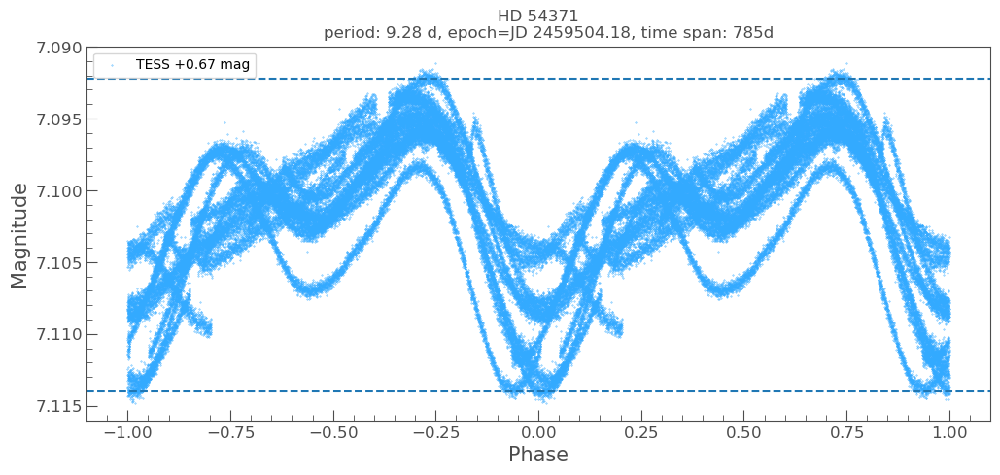

In [205]:
ax, lc_f_res = lkem.fold_n_plot_multi_bands(
    {"TESS": lc_combined_dict_no_ecl["TESS"]},
    period=rot_period_final, # shorter period, around 2.9207, would make MASCARA and TESS data fit better, but at the expanse of Hipparocos, and TESS-only data
    epoch=Time(rot_epoch_time_hjd_final   , format="jd", scale="utc"),
    phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1    
    figsize=(12, 5),
    target_name=primary_name,
    # plot_options=plot_options,
);

rot_max_flux_mag, rot_min_flux_mag = 7.0922, 7.114
ax.axhline(rot_max_flux_mag, ls="--", label="max ROT");
ax.axhline(rot_min_flux_mag, ls="--", label="min ROT");

amp_rot_flux_mag = round(rot_min_flux_mag - rot_max_flux_mag, 2)
print(amp_rot_flux_mag)

## Plots for VSX

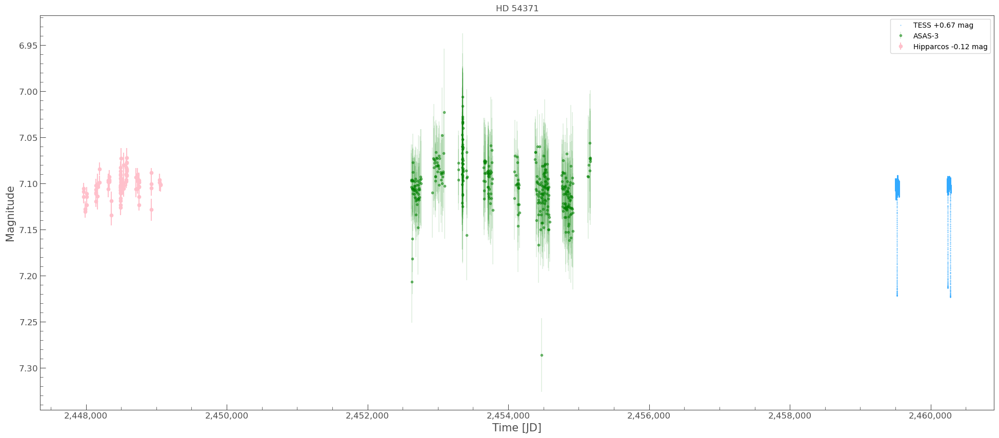

In [236]:
# reload(lkem)
plot_options = lkem.get_default_plot_multi_bands_options_copy()
plot_options[0][1]["zorder"] = 8  # push TESS data to the near the top
plot_options[1][1]['linewidth'] = 0.3
plot_options[1][1]['alpha'] = 0.5
plot_options[2][1]['linewidth'] = 1.5
plot_options[2][1]['markersize'] = 9
plot_options[2][1]['zorder'] = 9 # push HIP data to the top

ax = lkem.plot_multi_bands(lc_combined_dict, figsize=(24, 10), target_name=primary_name, plot_options=plot_options);
ax.set_title(ax.get_title() + "");
ylim = (None, None)
ax.set_ylim(*ylim);

### Phase Plot - ROT


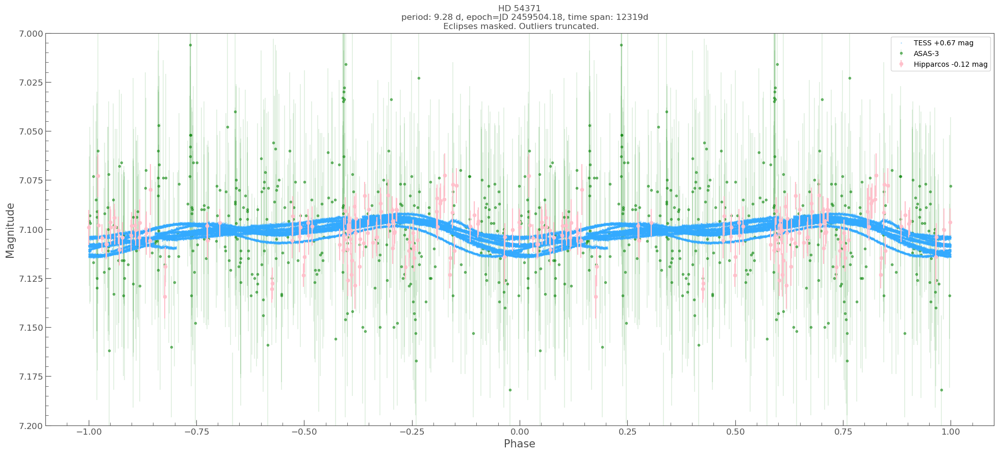

In [240]:
# reload(lkem)

ax, lc_f_res = lkem.fold_n_plot_multi_bands(
    lc_combined_dict_no_ecl,
    period=rot_period_final,
    epoch=Time(rot_epoch_time_hjd_final , format="jd", scale="utc"),
    phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1    
    figsize=(24, 10),
    target_name=primary_name,
    plot_options=plot_options,
);
ax.set_ylim(7.2, 7.0);
ax.set_title(ax.get_title() + "\n Eclipses masked. Outliers truncated.");


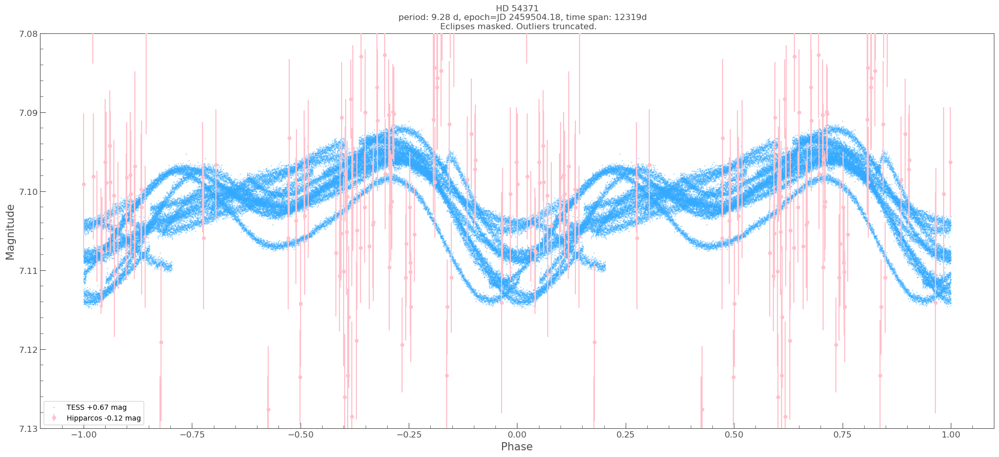

In [238]:
# TESS + HIP plot

# custom options so that the scheme used here (TESS = HIP) is consistent with the combined plot
plot_options_th = lkem.get_default_plot_multi_bands_options_copy()
plot_options_th[0][1]["zorder"] = 8  # push TESS data to the near the top
plot_options_th[1][1]['linewidth'] = 1.5  # ensure the scheme for HIP here is the same as the above plot
plot_options_th[1][1]['markersize'] = 9
plot_options_th[1][1]['zorder'] = 9 # push HIP data to the top
plot_options_th[1][1]['c'] = "pink" 

ax, lc_f_res = lkem.fold_n_plot_multi_bands(
    {"TESS": lc_combined_dict_no_ecl["TESS"], "Hipparcos": lc_combined_dict_no_ecl["Hipparcos"]},
    period=rot_period_final,
    epoch=Time(rot_epoch_time_hjd_final , format="jd", scale="utc"),
    phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1    
    figsize=(24, 10),
    target_name=primary_name,
    plot_options=plot_options_th,
);
ax.set_ylim(7.13, 7.08);
ax.set_title(ax.get_title() + "\n Eclipses masked. Outliers truncated.");

# Get the ELL amp in TESS
# _rot_min, _rot_max = 8.399, 8.377
# ax.axhline(_rot_min, c="red", linestyle="--", label="Min");
# ax.axhline(_rot_max, c="red", linestyle="--", label="Max");
# print("rot amp:", round(_rot_min - _rot_max, 3))

### Phase Plot - EA


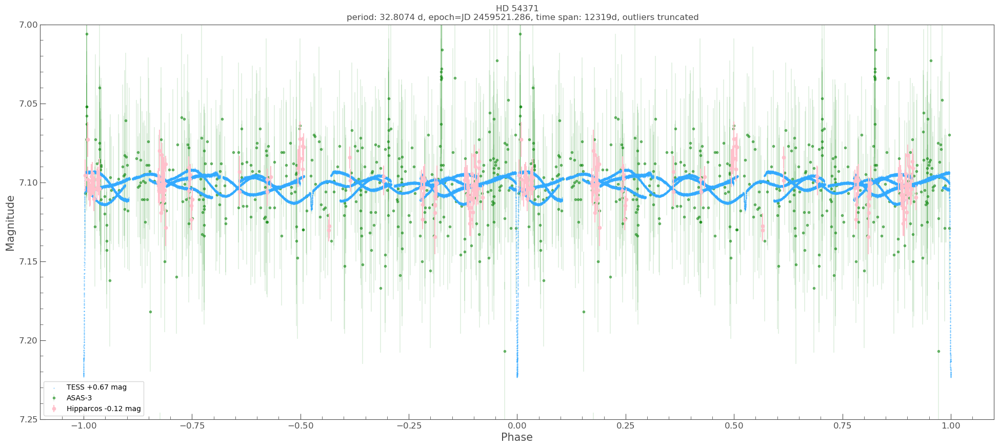

In [241]:
# reload(lkem)

ax, lc_f_res = lkem.fold_n_plot_multi_bands(
    lc_combined_dict,
    period=period_final,
    epoch=Time(epoch_time_hjd_final , format="jd", scale="utc"),
    phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1    
    figsize=(24, 10),
    target_name=primary_name,
    plot_options=plot_options,
);
ylim = (7.25, 7.0)
ax.set_ylim(*ylim);
ax.set_title(ax.get_title() + ", outliers truncated");


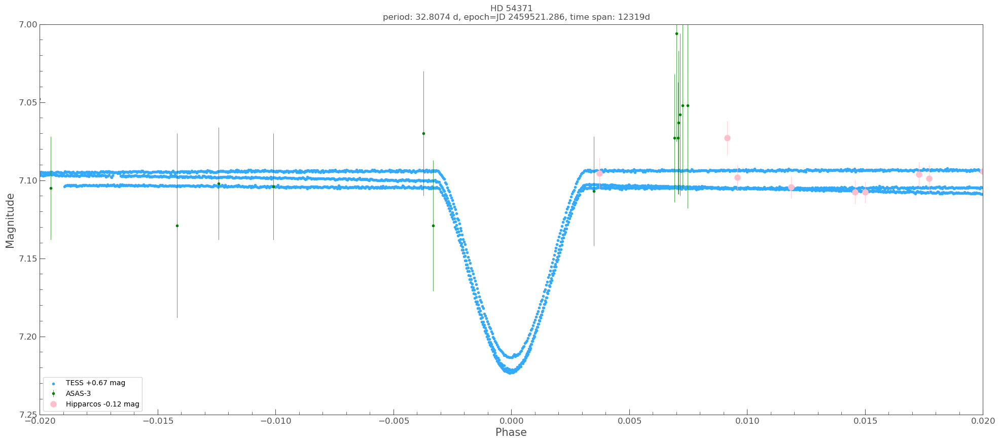

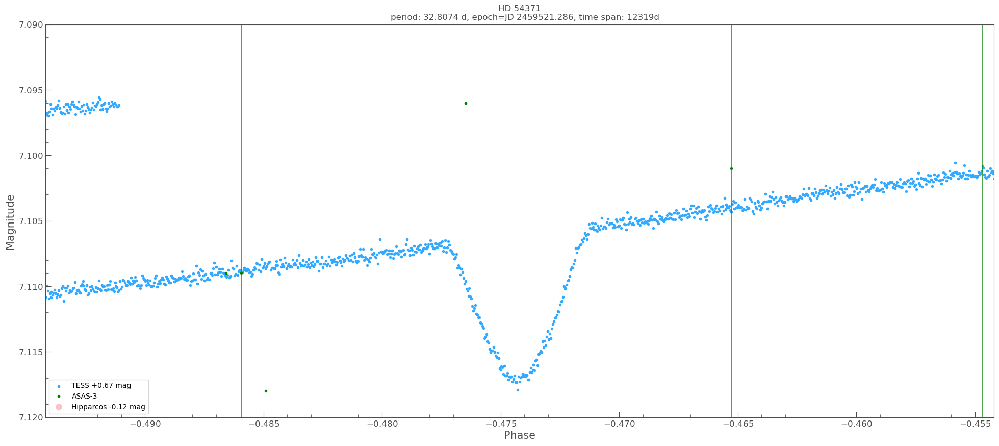

In [242]:

# zoom plot Min I
# - make TESS more visible:  larger dots
plot_options_zoom = lkem.get_default_plot_multi_bands_options_copy()
plot_options_zoom[0][1]["s"] = 9  # larger dots for TESS
plot_options_zoom[2][1]["markersize"] = 16  # larger marker for HIP

# # to workaround astropy TypeError: cannot write to unmasked output when doing matplotlib errorbar  plot
# _lc = lc_combined_dict['TESS'].copy()
# _lc.flux_err = _lc.flux_err.filled(np.nan)

ax, lc_f_res = lkem.fold_n_plot_multi_bands(
    lc_combined_dict,
    period=period_final,
    epoch=Time(epoch_time_hjd_final   , format="jd", scale="utc"),
    phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1
    target_name=primary_name,
    # duration_hr=duration_hr_min_i_final  ,  # for plotting only
    figsize=(24, 10),
    plot_options=plot_options_zoom,
    # mag_shift_precision=2,  #
);
ax.set_ylim(*ylim);
ax.legend(loc="lower left");
# ax.axvline(0, c="gray", linestyle="dotted");
ax.set_xlim(-0.02, 0.02);  # to see primary in details


ax, lc_f_res = lkem.fold_n_plot_multi_bands(
    lc_combined_dict,
    period=period_final,
    epoch=Time(epoch_time_hjd_final   , format="jd", scale="utc"),
    phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1
    target_name=primary_name,
    figsize=(24, 10),
    plot_options=plot_options_zoom,
    # mag_shift_precision=2,  #
);
ax.set_ylim(7.12, 7.09);
ax.legend(loc="lower left");
# ax.axvline(0, c="gray", linestyle="dotted");
ax.set_xlim(epoch_phase_min_ii_final -0.02, epoch_phase_min_ii_final + 0.02);  # to see secondary  in details



## VSX Report Table

In [178]:
def report_to_df(report):
    df = pd.DataFrame()
    df["Field"] = report.keys()
    df["Value"] = report.values()
    return df


def vsx_phase(phase):
    # the phase I used above is from [-0.5, +0.5]
    # convert to the phase [0, 1[ used by VSX
    if phase < -0.5 or phase > 0.5:
        raise ValueError(f"Input phase needs to be in [-0.5, 0.5] range. Actual: {phase}")
    if phase >= 0:
        return phase 
    else: 
        return 1 + phase


In [180]:
# test the num of digits needed for eclipse duration percent

print(duration_hr_min_i_final / 24 / period_final * 100)
print(duration_hr_min_i_final, period_final * 0.6 / 100 * 24)  # too short
print(duration_hr_min_i_final, period_final * 0.61 / 100 * 24)  # 2 digits needed

0.6096185616659655
4.8 4.724265599999999
4.8 4.80300336


In [248]:
import bibs_utils
reload(bibs_utils)


# TIC are not added, given the entry refers to thw whole system per SO
other_names = f"TIC {tic},SAO 79121,HIP 34567,BD+25 1594,2MASS J07093540+2543433,WISEA J070935.29+254341.4,TYC 1900-1598-1,Gaia DR3 882872210352301568,WDS J07096+2544A"  # TIC is not used as the primary name so it's here. Others: ExoFOP and  SIMBAD
other_names += ",CCDM J07096+2544A,GSC 01900-01598"   # Useful IDs from SIMBAD and GSC  -- https://vizier.cds.unistra.fr/viz-bin/VizieR-5?-ref=VIZ69291843aba07&-out.add=.&-source=I/255/out&GSC=0190001598
other_names += ",ASAS 070935+2543.7"  # use ASAS-3 data

remarks = (
    f"""Eccentric system. Min I amplitude: {amp_min_i_flux_mag} TESS. Min II at phase {vsx_phase(epoch_phase_min_ii_final)}, amplitude: {amp_min_ii_flux_mag} TESS, duration: {duration_hr_min_ii_final / 24 / period_final * 100:.2f}% . """
    f"""ROT elements: HJD {rot_epoch_time_hjd_final:.2f} + {rot_period_final} x E , amplitude {amp_rot_flux_mag} TESS . """ 
    f"""SB per 2015AJ....149...63F ."""
)  
# in the remarks, make no reference to nearby stars (it's in WDS), because the stars in questions appear to be visual double (no common plx / PN), faint, and relatively far away (30+ arcsec)
# the target has large PM so it moves across and become close to other stars by coincidence over time.
#
# WDS: https://vizier.cds.unistra.fr/viz-bin/VizieR-S?WDS%20J07096%2b2544
# correspond Gaia DR3:
# https://vizier.cds.unistra.fr/viz-bin/VizieR-4?-ref=VIZ6925f7fc2d9955&-to=-4b&-from=-3&-this=-4&%2F%2Fsource=%2BI%2F355%2Fgaiadr3%2BI%2F355%2Fparamp&%2F%2Fc=07%3A09%3A35.25+%2B25%3A43%3A40.42&%2F%2Ftables=I%2F355%2Fgaiadr3&%2F%2Ftables=I%2F355%2Fparamp&-out.max=50&%2F%2FCDSportal=http%3A%2F%2Fcdsportal.u-strasbg.fr%2FStoreVizierData.html&-out.form=HTML+Table&-out.add=_r&-out.add=_p&%2F%2Foutaddvalue=default&-sort=_r&-order=I&-oc.form=sexa&-nav=cat%3AI%2F355%26tab%3A%7BI%2F355%2Fgaiadr3%7D%26tab%3A%7BI%2F355%2Fparamp%7D%26key%3Asource%3D%2BI%2F355%2Fgaiadr3%2BI%2F355%2Fparamp%26key%3Ac%3D07%3A09%3A35.25+%2B25%3A43%3A40.42%26pos%3A07%3A09%3A35.25+%2B25%3A43%3A40.42%28+15+arcsec%29%26HTTPPRM%3A&-c=07%3A09%3A35.25+%2B25%3A43%3A40.42&-c.eq=J2000&-c.r=130&-c.u=arcsec&-c.geom=r&-source=&-out.src=I%2F355%2Fgaiadr3%2CI%2F355%2Fparamp&-x.rs=10&-source=I%2F355%2Fgaiadr3+I%2F355%2Fparamp&-out.orig=standard&-out=Source&-out=Plx&-out=PM&-out=pmRA&-out=pmDE&-out=sepsi&-out=IPDfmp&-out=RUWE&-out=Dup&-out=Gmag&Gmag=%3C+14&-out=BPmag&-out=RPmag&-out=BP-RP&-out=RV&-out=e_RV&-out=VarFlag&-out=NSS&-out=XPcont&-out=XPsamp&-out=RVS&-out=EpochPh&-out=EpochRV&-out=MCMCGSP&-out=MCMCMSC&-out=Teff&-out=logg&-out=%5BFe%2FH%5D&-out=Dist&-out=A0&-out=HIP&-out=PS1&-out=SDSS13&-out=SKYM2&-out=TYC2&-out=URAT1&-out=AllWISE&-out=APASS9&-out=GSC23&-out=RAVE5&-out=2MASS&-out=RAVE6&-out=RAJ2000&-out=DEJ2000&-out=Pstar&-out=PWD&-out=Pbin&-out=ABP&-out=ARP&-out=GMAG&-out=Rad&-out=SpType-ELS&-out=Rad-Flame&-out=Lum-Flame&-out=Mass-Flame&-out=Age-Flame&-out=Flags-Flame&-out=Evol&-out=z-Flame&-meta.ucd=2&-meta=1&-meta.foot=1&-meta.form=1&-usenav=1&-bmark=GET

revision_comment = (
    # "Type, eclipsing period / epoch / duration from TESS, ASAS-3 and Hipparcos data. ROT period / epoch from TESS data. All amplitudes from TESS data. "  #  it seems not to be needed for new submission
    "Mean magnitude from GCPD. Spectral type from 2003AJ....126.2048G . Position from Gaia DR3."
)


BIBS = bibs_utils.BIBS
vsx_report = dict(
    Position=f"{target_coord.ra.value}, {target_coord.dec.value}",
    Primary_Name=primary_name,
    Other_Names=other_names,
    Variable_Type="EA+ROT",  
    Spectral_Type="G6V",  # B/mk -- https://vizier.cds.unistra.fr/viz-bin/VizieR-5?-ref=VIZ692741ca23d5a1&-out.add=.&-source=B/mk/mktypes&recno=330723
    Spectral_Type_Uncertain=False,
    Maximum_Magnitude=f"7.09",  # GCPD  -- https://vizier.cds.unistra.fr/viz-bin/VizieR-5?-ref=VIZ69260223156f72&-out.add=.&-source=II/167/catalog&recno=39775  
    Maximum_Magnitude_band="V",
    Minimum_Magnitude=f"{amp_total_flux_mag}",   
    Minimum_Magnitude_band="TESS",  
    Minimum_Is_Amplitude=True,
    Period=f"{period_final}",  
    Epoch=f"{epoch_time_hjd_final:}", 
    Rise_Duration_Pct=f"{duration_hr_min_i_final / 24 / period_final * 100:.2f}",
    Discoverer="Sam Lee, Planet Hunters TESS Collaboration",  # PHT Talk: https://www.zooniverse.org/projects/nora-dot-eisner/planet-hunters-tess/talk/subjects/94815975, https://www.zooniverse.org/projects/nora-dot-eisner/planet-hunters-tess/talk/subjects/71397355, etc.
    Remarks=remarks,
    Revision_Comment=revision_comment,
    Reference0_Name=BIBS.TESS_N,
    Reference0_Bib=BIBS.TESS_B,
    Reference1_Name=BIBS.ASAS3_N,
    Reference1_Bib=BIBS.ASAS3_B,
    Reference2_Name=BIBS.HIP_N,
    Reference2_Bib=BIBS.HIP_B,
    Reference3_Name=BIBS.GCPD_N,  # for reference V mag
    Reference3_Bib=BIBS.GCPD_B,
    Reference4_4_Name="Gray, R. O.; et al., 2003, Contributions to the Nearby Stars (NStars) Project: Spectroscopy of Stars Earlier than M0 within 40 Parsecs: The Northern Sample. I.",  # for spectral type
    Reference4_4_Bib="2003AJ....126.2048G",
    Reference5_Name="Fekel, F. C.; et al., 2015, New Precision Orbits of Bright Double-Lined Spectroscopic Binaries. IX. HD 54371, HR 2692, and 16 Ursa Majoris",  # SB found in: https://sb9.astro.ulb.ac.be//DisplayFull.cgi?435+2
    Reference5_Bib="2015AJ....149...63F",
)


def print_long_fields(report):
    other_names_list = report["Other_Names"].split(",")
    print("Other Names (1 line each):")
    print("\n".join(other_names_list))
    print("")
    print(report["Remarks"])
    print("")
    print(report["Revision_Comment"])

print_long_fields(vsx_report)
with pd.option_context('display.max_colwidth', None):
    display(report_to_df(vsx_report))


# Combined LC probably not needed for EA with no long term variation
# tic385464250_combined_plot.png : Combined light curve - Combined light curve from from TESS (QLP) and ASAS3, shifted to ASAS3.
print("""
tic87869692_phase_plot_eclipses.png : EA Phase Plot - EA Phase Plot from TESS, ASAS-3, and Hipparcos data. Shifted to ASAS-3.
tic87869692_phase_plot_eclipses_zoom_min_i.png : EA Phase Plot (Min I Zoom) - EA Phase Plot from EA Phase Plot from TESS, ASAS-3, and Hipparcos data. Zoomed around Min I.
tic87869692_phase_plot_eclipses_zoom_min_ii.png : EA Phase Plot (Min II Zoom) - EA Phase Plot from EA Phase Plot from TESS, ASAS-3, and Hipparcos data. Zoomed around Min II.
tic87869692_phase_plot_rot.png : Rotation Phase Plot - Rotation Phase Plot from TESS, ASAS-3, and Hipparcos data. Shifted to ASAS-3. Eclipses masked.
tic87869692_phase_plot_rot_tess_hip.png : Rotation Phase Plot (TESS + Hipparcos only) - Rotation Phase Plot from TESS and Hipparcos data. Eclipses masked.
""")


Other Names (1 line each):
TIC 87869692
SAO 79121
HIP 34567
BD+25 1594
2MASS J07093540+2543433
WISEA J070935.29+254341.4
TYC 1900-1598-1
Gaia DR3 882872210352301568
WDS J07096+2544A
CCDM J07096+2544A
GSC 01900-01598
ASAS 070935+2543.7

Eccentric system. Min I amplitude: 0.12 TESS. Min II at phase 0.5258, amplitude: 0.01 TESS, duration: 0.61% . ROT elements: HJD 2459504.18 + 9.28 x E , amplitude 0.02 TESS . SB per 2015AJ....149...63F .

Mean magnitude from GCPD. Spectral type from 2003AJ....126.2048G . Position from Gaia DR3.


,Field,Value
0,Position,"107.39745631092, 25.72864762682"
1,Primary_Name,HD 54371
2,Other_Names,"TIC 87869692,SAO 79121,HIP 34567,BD+25 1594,2MASS J07093540+2543433,WISEA J070935.29+254341.4,TYC 1900-1598-1,Gaia DR3 882872210352301568,WDS J07096+2544A,CCDM J07096+2544A,GSC 01900-01598,ASAS 070935+2543.7"
3,Variable_Type,EA+ROT
4,Spectral_Type,G6V
5,Spectral_Type_Uncertain,False
6,Maximum_Magnitude,7.09
7,Maximum_Magnitude_band,V
8,Minimum_Magnitude,0.13
9,Minimum_Magnitude_band,TESS



tic87869692_phase_plot_eclipses.png : EA Phase Plot - EA Phase Plot from TESS, ASAS-3, and Hipparcos data. Shifted to ASAS-3.
tic87869692_phase_plot_eclipses_zoom_min_i.png : EA Phase Plot (Min I Zoom) - EA Phase Plot from EA Phase Plot from TESS, ASAS-3, and Hipparcos data. Zoomed around Min I.
tic87869692_phase_plot_eclipses_zoom_min_ii.png : EA Phase Plot (Min II Zoom) - EA Phase Plot from EA Phase Plot from TESS, ASAS-3, and Hipparcos data. Zoomed around Min II.
tic87869692_phase_plot_rot.png : Rotation Phase Plot - Rotation Phase Plot from TESS, ASAS-3, and Hipparcos data. Shifted to ASAS-3. Eclipses masked.
tic87869692_phase_plot_rot_tess_hip.png : Rotation Phase Plot (TESS + Hipparcos only) - Rotation Phase Plot from TESS and Hipparcos data. Eclipses masked.

